### ESN application: Classification and layer-wise relevance propagation (LRP) with baseESN on ENSO

Inspired by [Woodward et al., 2011](https://www.sacral.c.u-tokyo.ac.jp/pdf/woodward_ivcnz_2011.pdf) paper "A Reservoir Computing approach to Image Classification using Coupled Echo State and Back-Propagation Neural Networks" and [Toms et al, 2020](https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2019MS002002) paper "Physically Interpretable Neural Networks for the Geosciences: Applications to Earth System Variability", we want to reproduce some of their results and go beyond. 

#### Data and derived sst anomaly index

SST data: https://downloads.psl.noaa.gov/Datasets/noaa.ersst.v5/sst.mnmean.nc

Data contains **monthly mean SST** from 1854 .. 2021, in a 2° by 2° lat/lon grid:  
**lat:** 88N .. -88N (= 88S)  
**lon:** 0E .. 358E

Start from 1880. Following https://climatedataguide.ucar.edu/climate-data/nino-sst-indices-nino-12-3-34-4-oni-and-tni and using the NINO3.4 box, we can diagnose the El-Nino-Southern-Oscillation Index (ENSO) from sea-surface temperature (SST). However, recipe for calculating ENSO requires some rolling mean. We omit the rolling mean here and directly take **sst anomaly index** instead.

#### Outline

- Calculate sst anomaly index
- Pre-processing of model inputs and targets
- Classify sst anomaly fields (El Nino / La Nina)
- Layer-wise relevance propagation
- Compare results for different models:
 * baseESN: Feed inputs row- and column-wise
 * Coupled baseESN
 
This **fifth part of the experiment** aims to refactor former code and experiments from the first four parts:

* Focus on coupled ESN and baseESN (col- / row-wise). 
* Idea: Take inputs that worked best / good in former experiments: 
 * NaN to zero
 * q-lim 0.5 .. 0.995%
 * ignore weird values
 * scale to [-1,1]
 * tanh activation
* But switched back to **single target**: Take **continuous sst anomaly index**, since one-hot targets leed to redundant ("inverted") trained output weights and bias. Plus we lose information with binary one-hot targets compared to full information contained in sst anomaly index values.

### Tech preamble

In [1]:
import xarray as xr
import numpy as np
from matplotlib import pyplot as plt
from statsmodels.tsa.stattools import adfuller
from scipy.special import softmax, expit

import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Lambda, concatenate, Conv1D, LSTM, BatchNormalization, LeakyReLU
from tensorflow.keras.optimizers import Adam, SGD
import tensorflow.keras.initializers as tfi
import tensorflow.keras.regularizers as tfr
from tensorflow.keras.utils import plot_model

import hvplot.xarray
import matplotlib.patches as patches

### Work with my own library of useful ESN functions
from ESN_functions_v05 import * 

### Load SST data

In [2]:
# Use, when working with relative path on local machine (or nesh)
sst_path = "../data/sst.mnmean.nc"
sst_dataset = xr.open_dataset(sst_path)
sst_dataset

<xarray.Dataset>
Dimensions:    (lat: 89, lon: 180, time: 2015, nbnds: 2)
Coordinates:
  * lat        (lat) float32 88.0 86.0 84.0 82.0 ... -82.0 -84.0 -86.0 -88.0
  * lon        (lon) float32 0.0 2.0 4.0 6.0 8.0 ... 352.0 354.0 356.0 358.0
  * time       (time) datetime64[ns] 1854-01-01 1854-02-01 ... 2021-11-01
Dimensions without coordinates: nbnds
Data variables:
    time_bnds  (time, nbnds) float64 ...
    sst        (time, lat, lon) float32 ...
Attributes: (12/37)
    climatology:               Climatology is based on 1971-2000 SST, Xue, Y....
    description:               In situ data: ICOADS2.5 before 2007 and NCEP i...
    keywords_vocabulary:       NASA Global Change Master Directory (GCMD) Sci...
    keywords:                  Earth Science > Oceans > Ocean Temperature > S...
    instrument:                Conventional thermometers
    source_comment:            SSTs were observed by conventional thermometer...
    ...                        ...
    creator_url_original:      https://www.ncei.noaa.gov
    license:                   No constraints on data access or use
    comment:                   SSTs were observed by conventional thermometer...
    summary:                   ERSST.v5 is developed based on v4 after revisi...
    dataset_title:             NOAA Extended Reconstructed SST V5
    data_modified:             2021-12-06

### Calculating SST anomaly index from sst data

There are several indices used to monitor the tropical Pacific, all of which are based on SST anomalies averaged across a given region.  Usually the anomalies are computed relative to a base period of 30 years.  The Niño 3.4 index is one of the most commonly used indices to define El Niño and La Niña events.

Website https://climatedataguide.ucar.edu/climate-data/nino-sst-indices-nino-12-3-34-4-oni-and-tni gives introduction to ENSO indices. [Morrow et al., 2010](http://www.ccpo.odu.edu/~klinck/Reprints/PDF/morrowJGR2010.pdf) show in their paper "Eddy response to Southern Ocean climate modes" an index for Niño 3.4 region (5°N–5°S, 120–170°W) in the tropical Pacific. The website references a link to an "expert guide" with more detailed information and a recipe on calculating ENSO indices:

(...) Nino X Index computation: (a) Compute area averaged total SST from Niño X region; (b) Compute monthly climatology (here 1980-2009) for area averaged total SST from Niño X region, and subtract climatology from area averaged total SST time series to obtain anomalies; (c) Smooth the anomalies with a 5-month running mean; (d) Normalize the smoothed values by its standard deviation over the climatological period. (...)

**Note:** We omit smoothing with rolling mean here and hence call it *sst anomaly index* instead of *ENSO index*.

In [3]:
### Compute area averaged total SST from Niño 3.4 region (5°N–5°S, 120–170°W).
# Note: Since the box of interest is close to equator (5°N-5°S) we simply average over the box area and don't take care
# care of area weighting here.
# Note: latitude comes in a grid 88, 86, .., -86, 88, slice(5,-5) is actually using (4°N-4°S) only.
# Note: longitude ranges from 0 to 358°E. Region of interest (120-170°W) translates to (190°E-240°E) here.
sst_mean = (
    sst_dataset.sst.sel(time=slice('1880-01-01', '2021-11-01'))
    .sel(lat=slice(5,-5)).sel(lon=slice(190,240))
    .mean(("lat", "lon"))
)

# Compute monthly climatology (here: 1980-2009) for area averaged total SST from Niño 3.4 region.
# "Monthly" means grouping by month before calculating average over time.
sst_climatology_monthly = (
    sst_dataset.sst
    .sel(time=slice('1980-01-01','2009-12-01'))
    .sel(lat=slice(5,-5))
    .sel(lon=slice(190,240))
    .mean(("lat", "lon"))
    .groupby("time.month")
    .mean("time")    
)

# Compute std dev in time for total climatology (here: 1980-2009), 
# use area averaged total SST from Niño 3.4 region
sst_climatology_total_std = (
    sst_dataset.sst
    .sel(time=slice('1980-01-01','2009-12-01'))
    .sel(lat=slice(5,-5))
    .sel(lon=slice(190,240))
    .mean(("lat", "lon"))
    .std("time")          
)

# Subtract monthly climatology from area averaged total SST time series to obtain anomalies
sst_anomaly_monthly = sst_mean.groupby("time.month") - sst_climatology_monthly

# ENSO index is calculated as 5 months rolling mean of sst anomaly.
# We aim to label time sclices of lat/lon grids according to their phase: "El Nino" / "La Nina".
# This requires sst_anomaly WITHOUT rolling mean!
# But still normalize sst anomaly by dividing by standard deviation of sst climatology, as required for ENSO index:
sst_anomaly_norm = sst_anomaly_monthly / sst_climatology_total_std

trend parameters:  [ 3.80830543e-04 -6.57000607e-01]


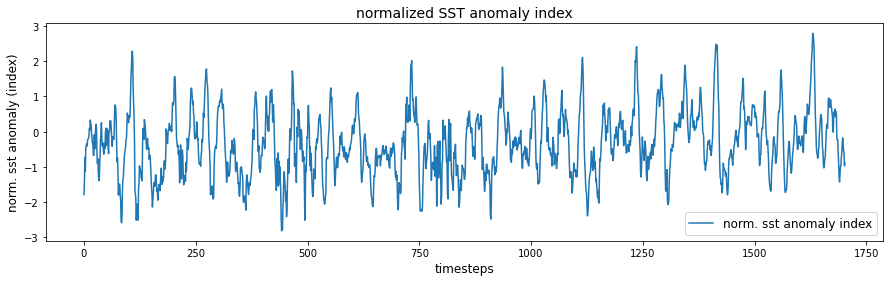

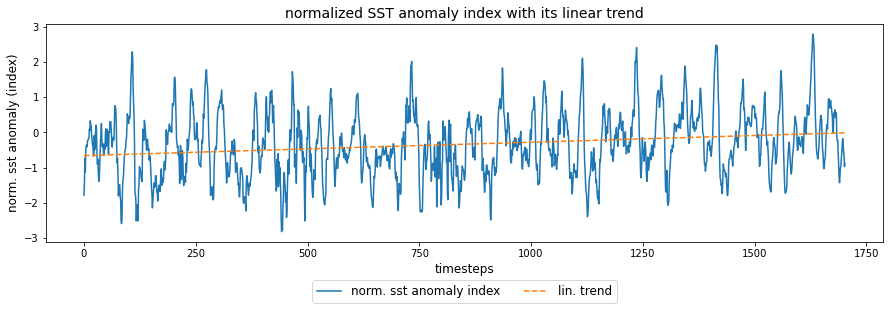

In [4]:
## OPTIONALLY: de-trending norm. sst anomaly index using first order polynomial fit, to remove linear trend.

# Get trend parameters from polyfit
x_index = np.array(range(len(sst_anomaly_norm.values)))
trend_param = np.polyfit(x_index, sst_anomaly_norm.values, 1)
print("trend parameters: ",trend_param)

# Restore trend from obtained trend parameters
trend = x_index*trend_param[0]+trend_param[1]

# Plot original timeseries (norm. sst anomaly index)
plt.figure(figsize=(15, 4))
plt.plot(range(len(sst_anomaly_norm.values)), sst_anomaly_norm.values, label='norm. sst anomaly index')
plt.xlabel('timesteps', fontsize=12)
plt.ylabel('norm. sst anomaly (index)', fontsize=12)
plt.title('normalized SST anomaly index', fontsize=14)
plt.legend(fontsize=12)
plt.show()

# Plot original timeseries (norm. sst anomaly index) together with linear trend
plt.figure(figsize=(15, 4))
plt.plot(range(len(sst_anomaly_norm.values)), sst_anomaly_norm.values, label='norm. sst anomaly index')
plt.xlabel('timesteps', fontsize=12)
plt.ylabel('norm. sst anomaly (index)', fontsize=12)
plt.plot(range(len(trend)), trend, linestyle='--', label='lin. trend')
plt.title('normalized SST anomaly index with its linear trend', fontsize=14)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=True, shadow=False, ncol=2, fontsize=12)
plt.show()

sst_anomaly_norm.values = sst_anomaly_norm.values - trend

### Pre-processing of model inputs and targets

Different models require different inputs and targets. Linear regression performes best on **scaled** and **flattened** sst anomaly fields as inputs and un-scaled **continuous** normalized sst anomaly index as targets.

Other models prefer **capped** and scaled inputs instead. And feeding inputs column-wise requires **swapping** of latitude and longitude.

Besides **continuous target values** - scaled or unscaled, we provide **binary and one-hot targets**.

rel. amount of NaN values in inputs:  0.314
NaN values in inputs BEFORE setting NaN to ZERO:  5228248
ZERO values in inputs BEFORE setting NaN to ZERO:  3
ZERO values in inputs AFTER setting NaN to ZERO:  5228251
rel. amount of valid gridpoints:  0.686


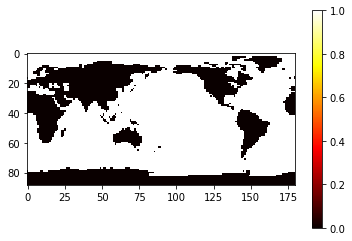


inputs shape (all input samples):  (1039, 89, 180)
train_input shape:  (831, 89, 180)
train_input_swap shape:  (831, 180, 89)
val_input shape:  (208, 89, 180)
val_input_swap shape:  (208, 180, 89)

NaN values removed:  True
train_input_flat shape:  (831, 1, 10988)
train_input_flat_small shape:  (831, 1, 2772)
val_input_flat shape:  (208, 1, 10988)
val_input_flat_small shape:  (208, 1, 2772)

targets shape (all targets):  (1039, 1)
train_target shape:  (831, 1)
train_target_bin shape:  (831, 1)
train_target_onehot shape:  (831, 2)
val_target shape:  (208, 1)
val_target_bin shape:  (208, 1)
val_target_onehot shape:  (208, 2)

cap method:  abs_lim
train_inputs min:  -5.0
train_inputs max:  5.0

scaled train_inputs min:  -1.0
scaled train_inputs max:  1.0
scaled val_inputs min:  -1.0
scaled val_inputs max:  1.0

un-scaled train_target min:  -2.8181634
un-scaled train_target max:  2.4123752
un-scaled val_target min:  -1.7919745
un-scaled val_target max:  2.7960107

scaled train_target min:

In [4]:
### Prepare inputs and targets from sst anomaly fields

## Set parameters upfront:

train_val_split = 0.8 # Set rel. amount of samples used for training.
scale_to = 'one_one' # Choose to scale inputs to [-1,1] ('one_one') or [0,1] ('zero_one'), or 'no' scaling.
remove_NaN = True # If True, gridoints of former NaN values (set to zero) are NOT included in vectorized inputs.

# Either set limits to quantile limits (e.g. 0.005 and 0.995% quantile) or set absolute limits:
cap_method = 'abs_lim' # 'q_lim' or 'abs_lim'

# For working with absolute limits, specify upper and lower limit:
upper_cap_limit = 5
lower_cap_limit = -5

# For working with quantile limits, specify percentile:
quantile_perc = 0.005

# Again start with raw sst fields as lat/lon grids in time, from 1880 to date:
sst_fields = (
    sst_dataset.sst
    .sel(time=slice('1880-01-01', '2021-11-01'))
)

# Compute monthly climatology (here 1980 - 2009) for whole world
sst_climatology_fields = (
    sst_dataset.sst
    .sel(time=slice('1980-01-01','2009-12-01'))
    .groupby("time.month")
    .mean("time")
)

# Get sst anomaly fields by subtracting monthly climatology from raw sst fields:
sst_anomaly_fields = sst_fields.groupby("time.month") - sst_climatology_fields

# Only keep sst anomaly fields connected either El Nino or La Nina event.
sst_anomaly_fields_NinoNina = sst_anomaly_fields[(sst_anomaly_norm.values > 0.5) | (sst_anomaly_norm.values < -0.5)]

# Extract sst anomaly fields' values as iputs:
inputs = np.copy(sst_anomaly_fields_NinoNina.values)

# Check how many NaN values we have, coming from landmasses, where we obviously don't have sst values:
temp_isnan = np.isnan(sst_anomaly_fields_NinoNina.values)
temp_isnan_rel = np.sum(temp_isnan) / np.size(temp_isnan)
print("rel. amount of NaN values in inputs: ", np.round(temp_isnan_rel,3))
print("NaN values in inputs BEFORE setting NaN to ZERO: ", np.sum(temp_isnan))

# Check for existing ZERO values in inputs BEFORE setting NaN to ZERO
print("ZERO values in inputs BEFORE setting NaN to ZERO: ", np.sum(inputs==0))

## Set NaN values to ZERO.
# It might be a problem to first set nan values to zero, then apply min/max scaling.
# After scaling former nan values are non-zero!
# On the other hand we cannot get necessary min/max values as long as we have nan values.
# Solution: Replace nan by zero. Apply min/max scaling. Then again set former nan values to zero.
inputs[temp_isnan] = 0
print("ZERO values in inputs AFTER setting NaN to ZERO: ", np.sum(inputs==0))

# Get targets from sst anomaly index:
targets = sst_anomaly_norm.values[(sst_anomaly_norm.values > 0.5) | (sst_anomaly_norm.values < -0.5)]

# Convert targets to binary targets (1 / 0) for El Nino / La Nina.
targets_bin = (targets > 0.5).astype(int)

# Reshape targets to (samples, 1):
targets = targets.reshape((len(targets), 1))
targets_bin = targets_bin.reshape((len(targets_bin), 1))

# Create one-hot targets for two unit output (El Nino / La Nina):
targets_onehot = np.concatenate([(targets_bin==1).astype(int),(targets_bin==0).astype(int)], axis=1)

## Take care of outliers in sst anomaly values:

# Get number of train samples:
n_train = int(len(inputs) * train_val_split)

# Copy inputs to provide un-capped version:
inputs_uncapped = np.copy(inputs)

# Act according to desired cap-method - either use quantile limits or specified absolute limits:
if cap_method == 'abs_lim':

    # Set inputs with values outside specified limits to limit value:
    inputs[inputs > upper_cap_limit] = upper_cap_limit
    inputs[inputs < lower_cap_limit] = lower_cap_limit

elif cap_method == 'q_lim':   
    
    # get quantile limits for for specified X% quantile on ALL data (year 2002..2015)
    q_lower_limit = np.quantile(inputs[:n_train].flatten(), quantile_perc)
    q_upper_limit = np.quantile(inputs[:n_train].flatten(), 1 - quantile_perc)
    
    # OR: get quantile limits for for specified X% quantile on ALL data (year 2002..2015)
    #q_lower_limit = np.quantile(inputs.flatten(), quantile_perc)
    #q_upper_limit = np.quantile(inputs.flatten(), 1 - quantile_perc)
    
     # Set inputs with values outside specified limits to limit value:
    inputs[inputs > q_upper_limit] = q_upper_limit
    inputs[inputs < q_lower_limit] = q_lower_limit
    
## Split inputs and targets into train and validation data according to train_val_split.

## Optionally scale capped and uncapped inputs to [-1,1] or [0,1] 
## according to min/max obtained from only train inputs.

# Remenber min/max used for scaling.
train_min = np.min(inputs[:n_train])
train_max = np.max(inputs[:n_train])
train_min_uncapped = np.min(inputs_uncapped[:n_train])
train_max_uncapped = np.max(inputs_uncapped[:n_train])

# Scale inputs depending on desired scaling parameter:
if scale_to == 'one_one':
    # Scale inputs to [-1,1]:
    inputs = 2 * (inputs - train_min) / (train_max - train_min) - 1
    inputs_uncapped = 2 * (inputs_uncapped - train_min_uncapped) / (train_max_uncapped - train_min_uncapped) - 1
    
elif scale_to == 'zero_one':
    # Alternatively scale inputs to [0,1]
    inputs = (inputs - train_min) / (train_max - train_min)
    inputs_uncapped = (inputs_uncapped - train_min_uncapped) / (train_max_uncapped - train_min_uncapped)

# Again set former nan values to zero after scaling:
inputs[temp_isnan] = 0
inputs_uncapped[temp_isnan] = 0
    
## Create inputs with swapped lat <-> lon for feeding inputs column-wise into base ESN:
inputs_swap = np.swapaxes(inputs,1,2)
inputs_swap_uncapped = np.swapaxes(inputs_uncapped,1,2)

## Get valid gridpoints:
valid_gridpoints = (temp_isnan == False)
print("rel. amount of valid gridpoints: ",np.round(np.sum(valid_gridpoints) / np.size(valid_gridpoints),3))

# Plot valid gridpoints
plt.imshow(valid_gridpoints[0], cmap='hot', interpolation='nearest')
plt.colorbar()
plt.show()

## Create additional inputs with reduced resolution:
## Reduce inputs' dimension by a factor of 2 for both, lat and lon: Only take every second gridpoint into account.
inputs_small = inputs[:,np.arange(0,inputs.shape[1],2),:]
inputs_small = inputs_small[:,:,np.arange(0,inputs.shape[2],2)]
inputs_uncapped_small = inputs_uncapped[:,np.arange(0,inputs_uncapped.shape[1],2),:]
inputs_uncapped_small = inputs_uncapped_small[:,:,np.arange(0,inputs_uncapped.shape[2],2)]

# Now need valid gridpoints in reduced size by factor af 2 for both, lat and lon:
valid_gridpoints_small = valid_gridpoints[:,np.arange(0,valid_gridpoints.shape[1],2),:]
valid_gridpoints_small = valid_gridpoints_small[:,:,np.arange(0,valid_gridpoints.shape[2],2)]

## Create flattened inputs, optionally remove invalid gridoints:

# Now only keep valid inputs and flatten inputs, then restore first dimension as "samples" 
# and second dimension as "timestep" by reshaping:
if remove_NaN==True:
    inputs_flat = np.reshape(inputs[valid_gridpoints], (inputs.shape[0], 1, np.sum(valid_gridpoints[0].astype(int))))
    inputs_uncapped_flat = np.reshape(inputs_uncapped[valid_gridpoints], (inputs_uncapped.shape[0], 1, np.sum(valid_gridpoints[0].astype(int))))
    inputs_flat_small = np.reshape(inputs_small[valid_gridpoints_small], (inputs_small.shape[0], 1, np.sum(valid_gridpoints_small[0].astype(int))))
    inputs_uncapped_flat_small = np.reshape(inputs_uncapped_small[valid_gridpoints_small], (inputs_uncapped_small.shape[0], 1, np.sum(valid_gridpoints_small[0].astype(int))))

# Alternatively keep all inputs, but still flatten inputs, then restore first dimension as "samples" 
# and second dimension as "timestep" by reshaping:
elif remove_NaN==False:
    inputs_flat = np.reshape(inputs, (inputs.shape[0], 1, inputs.shape[1] * inputs.shape[2]))
    inputs_uncapped_flat = np.reshape(inputs_uncapped, (inputs.shape[0], 1, inputs.shape[1] * inputs.shape[2]))
    inputs_flat_small = np.reshape(inputs_small, (inputs_small.shape[0], 1, inputs_small.shape[1] * inputs_small.shape[2]))
    inputs_uncapped_flat_small = np.reshape(inputs_uncapped_small, (inputs_small.shape[0], 1, inputs_small.shape[1] * inputs_small.shape[2]))

## Split inputs and targets:
train_input = inputs[:n_train]
train_input_uncapped = inputs_uncapped[:n_train]
train_input_flat = inputs_flat[:n_train]
train_input_uncapped_flat = inputs_uncapped_flat[:n_train]
train_input_flat_small = inputs_flat_small[:n_train]
train_input_uncapped_flat_small = inputs_uncapped_flat_small[:n_train]
train_input_swap = inputs_swap[:n_train]
train_input_swap_uncapped = inputs_swap_uncapped[:n_train]
val_input = inputs[n_train:]
val_input_uncapped = inputs_uncapped[n_train:]
val_input_flat = inputs_flat[n_train:]
val_input_uncapped_flat = inputs_uncapped_flat[n_train:]
val_input_flat_small = inputs_flat_small[n_train:]
val_input_uncapped_flat_small = inputs_uncapped_flat_small[n_train:]
val_input_swap = inputs_swap[n_train:]
val_input_swap_uncapped = inputs_swap_uncapped[n_train:]
train_target = targets[:n_train]
train_target_bin = targets_bin[:n_train]
train_target_onehot = targets_onehot[:n_train]
val_target = targets[n_train:]
val_target_bin = targets_bin[n_train:]
val_target_onehot = targets_onehot[n_train:]

## Additionally scale targets to [-1,1] according to min/max obtained from only train targets.
# Remenber min/max used for scaling.
train_target_min = np.min(train_target)
train_target_max = np.max(train_target)
# Scale
train_target_scaled = 2 * (train_target - train_target_min) / (train_target_max - train_target_min) - 1
val_target_scaled = 2 * (val_target - train_target_min) / (train_target_max - train_target_min) - 1

# Dimensionality check:
print("\ninputs shape (all input samples): ", inputs.shape)
print("train_input shape: ", train_input.shape)
print("train_input_swap shape: ", train_input_swap.shape)
print("val_input shape: ", val_input.shape)
print("val_input_swap shape: ", val_input_swap.shape)
print("\nNaN values removed: ", remove_NaN)
print("train_input_flat shape: ", train_input_flat.shape)
print("train_input_flat_small shape: ", train_input_flat_small.shape)
print("val_input_flat shape: ", val_input_flat.shape)
print("val_input_flat_small shape: ", val_input_flat_small.shape)
print("\ntargets shape (all targets): ", targets.shape)
print("train_target shape: ", train_target.shape)
print("train_target_bin shape: ", train_target_bin.shape)
print("train_target_onehot shape: ", train_target_onehot.shape)
print("val_target shape: ", val_target.shape)
print("val_target_bin shape: ", val_target_bin.shape)
print("val_target_onehot shape: ", val_target_onehot.shape)
print("\ncap method: ", cap_method)
print("train_inputs min: ", train_min)
print("train_inputs max: ", train_max)
print("\nscaled train_inputs min: ", np.min(train_input))
print("scaled train_inputs max: ", np.max(train_input))
print("scaled val_inputs min: ", np.min(val_input))
print("scaled val_inputs max: ", np.max(val_input))
print("\nun-scaled train_target min: ", np.min(train_target))
print("un-scaled train_target max: ", np.max(train_target))
print("un-scaled val_target min: ", np.min(val_target))
print("un-scaled val_target max: ", np.max(val_target))
print("\nscaled train_target min: ", np.min(train_target_scaled))
print("scaled train_target max: ", np.max(train_target_scaled))
print("scaled val_target min: ", np.min(val_target_scaled))
print("scaled val_target max: ", np.max(val_target_scaled))



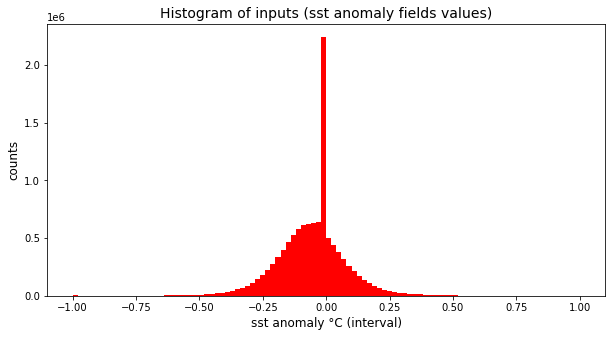

In [122]:
# Plot histogram of inputs, optionally capped and scaled:
nBins = 100
fig, axes = plt.subplots(1, 1, figsize=(10,5))
axes.hist(inputs_flat.flatten(), nBins, color="red")
#axes.hist(inputs_flat_small.flatten(), nBins, color="red")
#axes.hist(inputs_uncapped_flat.flatten(), nBins, color="blue")
#axes.hist(inputs_uncapped_flat_small.flatten(), nBins, color="red")
#axes.hist(inputs.flatten(), nBins, color="red")
#axes.hist(inputs_uncapped.flatten(), nBins, color="blue")
#axes.hist(train_input_uncapped.flatten(), nBins, color="blue")
#axes.hist(train_input_swap.flatten(), nBins, color="blue")
axes.set_ylabel("counts", fontsize=12)
axes.set_xlabel("sst anomaly °C (interval)", fontsize=12)
axes.set_title("Histogram of inputs (sst anomaly fields values)", fontsize=14)
plt.show()

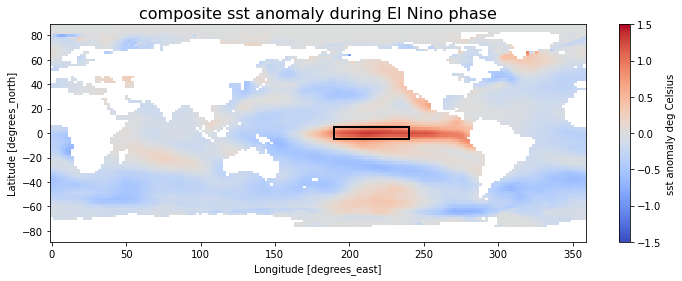

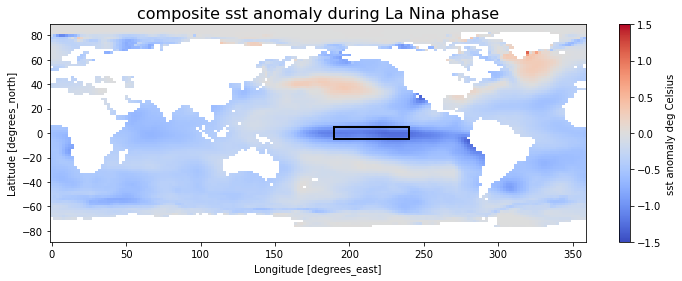

In [5]:
## Split sst anomaly fields related to El Nino or La Nina, respectively:

# El Nino
sst_anomaly_fields_ElNino = sst_anomaly_fields[(sst_anomaly_norm.values > 0.5)]

# La Nina
sst_anomaly_fields_LaNina = sst_anomaly_fields[(sst_anomaly_norm.values < -0.5)]

## Get mean sst anomaly field as composit of all sst fields belonging to either "El Nino" or "La Nina":

# El Nino
sst_anomaly_mean_ElNino = (
    sst_anomaly_fields_ElNino
    .mean("time")
)

# La Nina
sst_anomaly_mean_LaNina = (
    sst_anomaly_fields_LaNina
    .mean("time")
)

## Plot sst anomaly fields for the world, with bounding box arround Nino3.4 area

# El Nino
fig, ax = plt.subplots(figsize=(12, 4))
sst_anomaly_mean_ElNino.name = 'sst anomaly deg Celsius'
sst_anomaly_mean_ElNino.plot(ax=ax, cmap='coolwarm', vmax=1.5, vmin=-1.5)
plt.title('composite sst anomaly during El Nino phase', fontsize=16)

# Create a Rectangle patch and add the patch to the Axes
rect = patches.Rectangle((190, -5), 50, 10, linewidth=2, edgecolor='black', facecolor='none')
ax.add_patch(rect)

# La Nina
fig, ax = plt.subplots(figsize=(12, 4))
sst_anomaly_mean_LaNina.name = 'sst anomaly deg Celsius'
sst_anomaly_mean_LaNina.plot(ax=ax, cmap='coolwarm', vmax=1.5, vmin=-1.5)
plt.title('composite sst anomaly during La Nina phase', fontsize=16)

# Create a Rectangle patch and add the patch to the Axes
rect = patches.Rectangle((190, -5), 50, 10, linewidth=2, edgecolor='black', facecolor='none')
ax.add_patch(rect)

Text(0.5, 1.0, 'Regression of sst anomaly index onto sst anomaly fields')

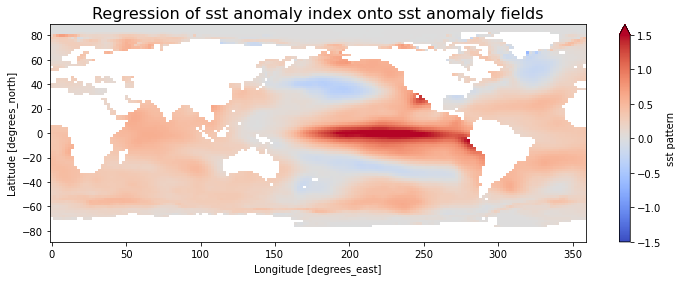

In [6]:
# Regression of sst anomaly index onto sst anomaly fields ("sst pattern")
sst_anomaly_index = sst_anomaly_norm[(sst_anomaly_norm.values > 0.5)| (sst_anomaly_norm.values < -0.5)]
sst_pattern = (sst_anomaly_index * sst_anomaly_fields_NinoNina).mean("time")

# Show sst pattern
fig, ax = plt.subplots(figsize=(12, 4))
sst_pattern.name = 'sst pattern'
sst_pattern.plot(ax=ax, cmap='coolwarm', vmax=1.5, vmin=-1.5)
plt.title('Regression of sst anomaly index onto sst anomaly fields', fontsize=16)

In [7]:
## Final check if samples are balanced, hence if we find equal number of EL Nino and La Nina events 
## in train and validation data:

print("ALL samples:")
print("rel. amount of El Nino samples: ", np.round(sum(targets_bin[:,0]==1)/len(targets),2))
print("rel. amount of La Nina samples: ", np.round(sum(targets_bin[:,0]==0)/len(targets),2))

print("\nTRAIN samples:")
print("rel. amount of El Nino samples: ", np.round(sum(train_target_bin[:,0]==1)/len(train_target),2))
print("rel. amount of La Nina samples: ", np.round(sum(train_target_bin[:,0]==0)/len(train_target),2))

print("\nVALIDATION samples:")
print("rel. amount of El Nino samples: ", np.round(sum(val_target_bin[:,0]==1)/len(val_target),2))
print("rel. amount of La Nina samples: ", np.round(sum(val_target_bin[:,0]==0)/len(val_target),2))

ALL samples:
rel. amount of El Nino samples:  0.28
rel. amount of La Nina samples:  0.72

TRAIN samples:
rel. amount of El Nino samples:  0.23
rel. amount of La Nina samples:  0.77

VALIDATION samples:
rel. amount of El Nino samples:  0.47
rel. amount of La Nina samples:  0.53


<function matplotlib.pyplot.show(close=None, block=None)>

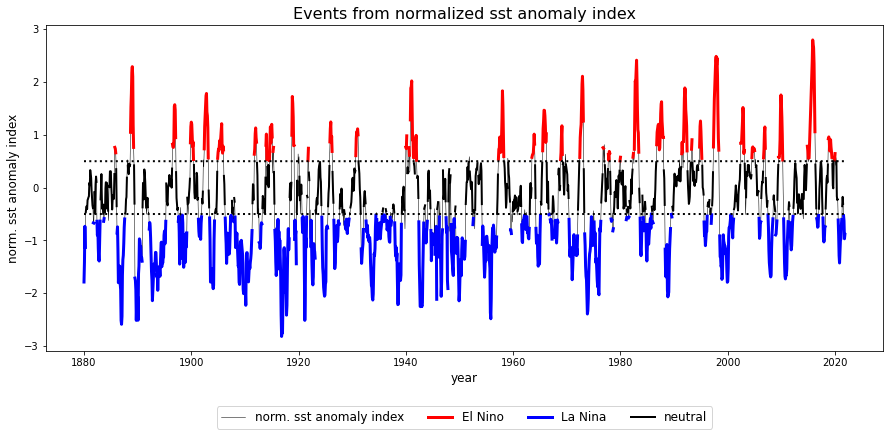

In [8]:
## Another way of highlighting distinct events:

# Mask events for plotting them in different colors
sst_ElNino = np.ma.masked_where(sst_anomaly_norm.values < 0.5, sst_anomaly_norm.values)
sst_LaNina = np.ma.masked_where(sst_anomaly_norm.values > -0.5, sst_anomaly_norm.values)
sst_neutral = np.ma.masked_where((sst_anomaly_norm.values >= 0.5) | (sst_anomaly_norm.values <= -0.5), sst_anomaly_norm.values)

# Focus on normalized ENSO index: Highlight events.
# > 0.5: EL Nino, < -0.5: La Nina, else: 'neutral'
fig, axes = plt.subplots(1, 1, figsize=(15,6))
axes.plot(sst_anomaly_norm.time, sst_anomaly_norm, label='norm. sst anomaly index', color='black', linewidth=0.5)
axes.plot(sst_anomaly_norm.time, sst_ElNino, label='El Nino', color='red', linewidth=3)
axes.plot(sst_anomaly_norm.time, sst_LaNina, label='La Nina', color='blue', linewidth=3)
axes.plot(sst_anomaly_norm.time, sst_neutral, label='neutral', color='black', linewidth=2)

axes.set_xlabel("year", fontsize=12)
axes.set_ylabel("norm. sst anomaly index", fontsize=12)
axes.set_title("Events from normalized sst anomaly index", fontsize=16)
axes.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=True, shadow=False, ncol=4, fontsize=12)

# Add horizontal lines
axes.plot(sst_anomaly_norm.time,0.5 * np.ones(len(sst_anomaly_norm)),'k:', linewidth=2)
axes.plot(sst_anomaly_norm.time,-0.5 * np.ones(len(sst_anomaly_norm)),'k:', linewidth=2)

plt.show

### Discussion on samples' balance

We find class imbalance: Have a lot more La Nina samples than El Nino samples, at least in train data. This should not be a problem for ESN models if we work with one-hot targets and train output weights for each class in a closed-form manner. And this is obviously another advantage compared to *regular* ANN architectures! But in this experiment we decided to switch back to single continuous targets. Let's see, if class imbalance causes trouble.

If balance is required, we could think about **de-trending** sst anomaly index, but not done here.

### Classify sst anomaly fields (El Nino / La Nina) and try LRP

* baseESN: Feed inputs row- and column-wise
* Coupled baseESN

### Classification with coupled base ESN

Inspired by [Woodward et al., 2011](https://www.sacral.c.u-tokyo.ac.jp/pdf/woodward_ivcnz_2011.pdf) paper "A Reservoir Computing approach to Image Classification using Coupled Echo State and Back-Propagation Neural Networks", we want to reproduce some of their results, but with baseESN models alone. The idea is to take a whole sst anomaly field as input for the first timestep and couple each gridpoint to exactly one reservoir unit. After that we let the reservoir swing for some timesteps without feeding additional inputs and try to use final reservoir states for image classification.

In [97]:
### Try classification of sst anomaly fields with coupled base ESN. Define parameters for ESN model upfront
verbose = True
input_length = 4 # Number of input timesteps. Note: Feed sst anomaly field as first input (t=1).
                 # For additional timesteps feed only zeros into ESN model.
                 # Need at least 2 timesteps to correctly set up ESN model with at least one recursion in reservoir.
n_layers = 1 # Number of ESN layers in the model.
n_res = train_input_flat_small.shape[2] # Number of reservoir units needs to equal number of input features (lat x lon).
W_in_lim = 0.1 # Initialize input weights from random uniform distribution in [- W_in_lim, + W_in_lim]
               # Note: Not needed for coupled approach, since we manually modify input weights.
leak_rate = 1 # Leak rate used in transition function of reservoir states.
leak_rate_first_step_YN = False # If true, multiply with alpha already in calculating first timestes's res. states.
activation = 'tanh' # Desired activation function to be used in calculating reservoir state transition.
spec_radius = 0.8 # Spectral radius, becomes largest Eigenvalue of reservoir weight matrix.
sparsity = 0.3 # Sparsity of reservoir weight matrix.
in_features = train_input_flat_small.shape[2] # Number of input features, directly taken from inputs' shape.
out_features = 1 # E.g. 2 for classifying sst anomaly fields according to El Nino / La Nina events with one-hot target.

In [98]:
# Modify train and validation inputs by adding zeros for additional timesteps.
train_input_add = np.zeros((train_input_flat_small.shape[0], input_length - 1, train_input_flat_small.shape[2]))
val_input_add = np.zeros((val_input_flat_small.shape[0], input_length - 1, val_input_flat_small.shape[2]))

# Concat former train and validation inputs with additional zeros:

# CAPPED
train_input_adj = np.concatenate([train_input_flat_small, train_input_add], axis=1)
val_input_adj = np.concatenate([val_input_flat_small, val_input_add], axis=1)

print("train input adj. shape (samples, timesteps, features): ", train_input_adj.shape)
print("val input adj. shape (samples, timesteps, features): ", val_input_adj.shape)

train input adj. shape (samples, timesteps, features):  (831, 4, 2772)
val input adj. shape (samples, timesteps, features):  (208, 4, 2772)


In [99]:
##### For input_length > 1:

# Get complete model (output = target prediction) plus short model (output final reservoir states from all layers)
# and all_states (= another shortened model that gives reservoir states for ALL timesteps for all inputs).
model, model_short, all_states = setESN(input_length=input_length, in_features=in_features,
                                        out_features=out_features, n_layers=n_layers,
                                        n_res=n_res, W_in_lim=W_in_lim, leak_rate=leak_rate,
                                        leak_rate_first_step_YN=leak_rate_first_step_YN,
                                        activation=activation, spec_radius=spec_radius,
                                        sparsity=sparsity, verbose=verbose)

/Users/mlandt-hayen/MarDATA/Python/EchoStateNetworks/notebooks/ESN_functions_v05.py:712: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_16 (InputLayer)        [(None, 4, 2772)]         0         
_________________________________________________________________
esn_15 (ESN)                 ((None, 4, 2772), (None,  15373512  
_________________________________________________________________
output (Dense)               (None, 1)                 2773      
Total params: 15,376,285
Trainable params: 15,376,285
Non-trainable params: 0
_________________________________________________________________
Model: "model_short"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_16 (InputLayer)        [(None, 4, 2772)]         0         
_________________________________________________________________
esn_15 (ESN)                 ((None, 4, 2772), (None,  15373512  
Total params: 15,373,512
Tra

/Users/mlandt-hayen/MarDATA/Python/EchoStateNetworks/notebooks/ESN_functions_v05.py:751: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())


/var/folders/jv/p__lpnd50w93ff78f84hkwkh7fs9_f/T/ipykernel_850/3415075405.py:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())



Model weights and biases, Dimensions:
input weights W_in (input features, res. units):  (2772, 2772)
input biases b_in (res. units):  (2772,)
reservoir weights W_res (res. units, res. units):  (2772, 2772)
reservoir biases b_res (res. units):  (2772,)
output weights W_out (res. units, output features):  (2772, 1)
output biases b_out (output features):  (1,)


/Users/mlandt-hayen/MarDATA/Python/EchoStateNetworks/notebooks/ESN_functions_v05.py:791: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())



shape of train input (samples, timesteps, input features):  (831, 4, 2772)
shape of model output X_T (samples, n_res):  (831, 2772)

Final reservoir states in augmented notation, shape:  (831, 2773)

train_target shape (samples, output features):  (831, 1)

W_out shape:  (2772, 1)
b_out shape:  (1,)

output feature  0 , trained b_out:  [-0.05366339]


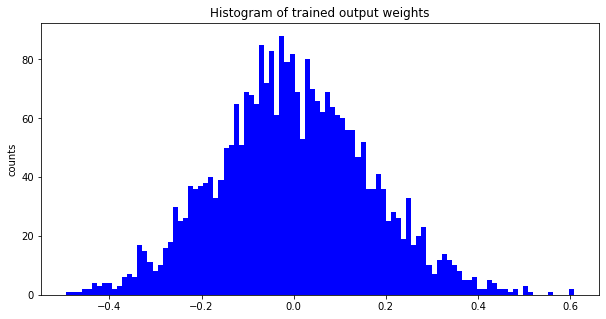


shape of val input (samples, timesteps, features):  (208, 4, 2772)
shape of train input (samples, timesteps, features):  (831, 4, 2772)

shape of model predictions on validation input (samples, 1):  (208, 1)
shape of val targets (samples, 1):  (208, 1)

train_mae:  0.0
val_mae:  0.0949

train_mse:  0.0
val_mse:  0.0129


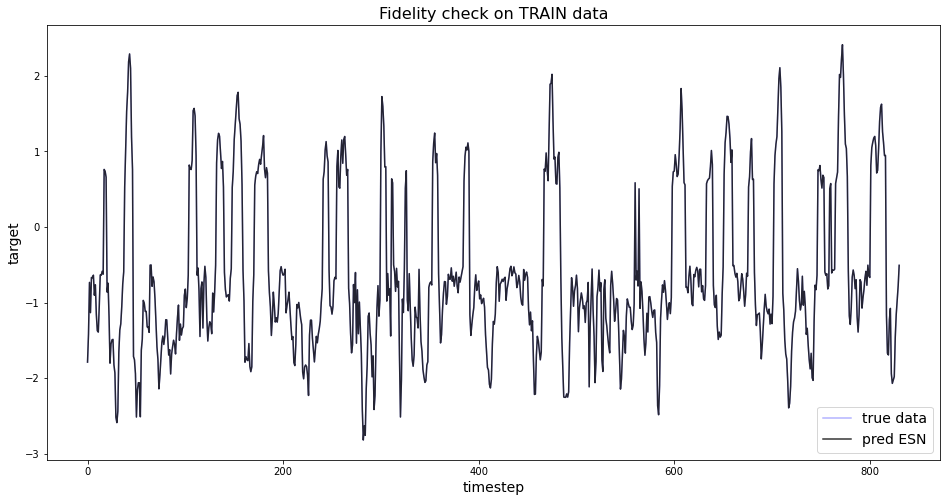

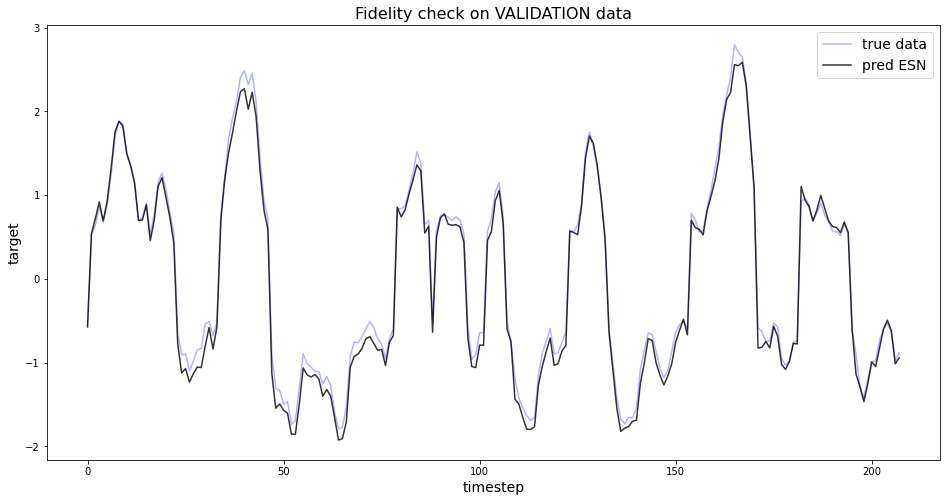

In [100]:
### Adjust input weights, set input and reservoir biases to zero.

## Get all weights:
model_weights = np.array(model.get_weights())

## Set input / reservoir / output weights and bias(es):
W_in = model_weights[0]
b_in = model_weights[1]
W_res = model_weights[2]
b_res = model_weights[3]
W_out = model_weights[4]
b_out = model_weights[5]

## Check dimensions:
print("\nModel weights and biases, Dimensions:")
print("=====================================")
print("input weights W_in (input features, res. units): ", W_in.shape)
print("input biases b_in (res. units): ", b_in.shape)
print("reservoir weights W_res (res. units, res. units): ", W_res.shape)
print("reservoir biases b_res (res. units): ", b_res.shape)
print("output weights W_out (res. units, output features): ", W_out.shape)
print("output biases b_out (output features): ", b_out.shape)

## Prepare zero input and reservoir biases:
b_in_zeros = np.zeros(b_in.shape)
b_res_zeros = np.zeros(b_res.shape)
model_weights[1] = b_in_zeros
model_weights[3] = b_res_zeros

## Prepare input weights having ONE on main diagonal and ZERO elsewhere:
W_in_diag = np.zeros((n_res,n_res))
for i in range(n_res):
    W_in_diag[i,i]=1
model_weights[0] = W_in_diag

# Get modified weights and biases back into the model
model.set_weights(model_weights)

# Train ESN model's output weights and bias
model = trainESN(model, model_short, train_input_adj, train_target, verbose=verbose)

# Get predictions from trained ESN model and evaluation metrics on model performance:
train_pred, val_pred, train_mae, val_mae, train_mse, val_mse = predESN(model, train_input_adj, val_input_adj,
                                                                       train_target, val_target,
                                                                       verbose=verbose)



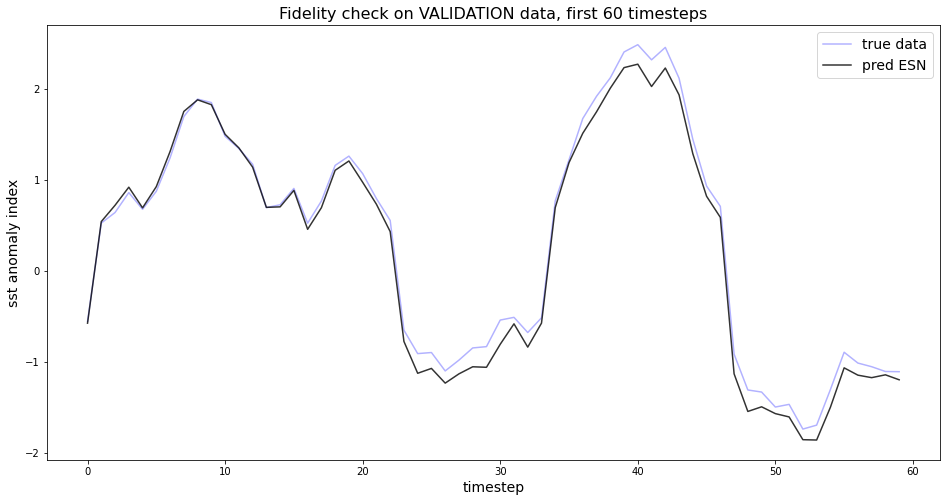

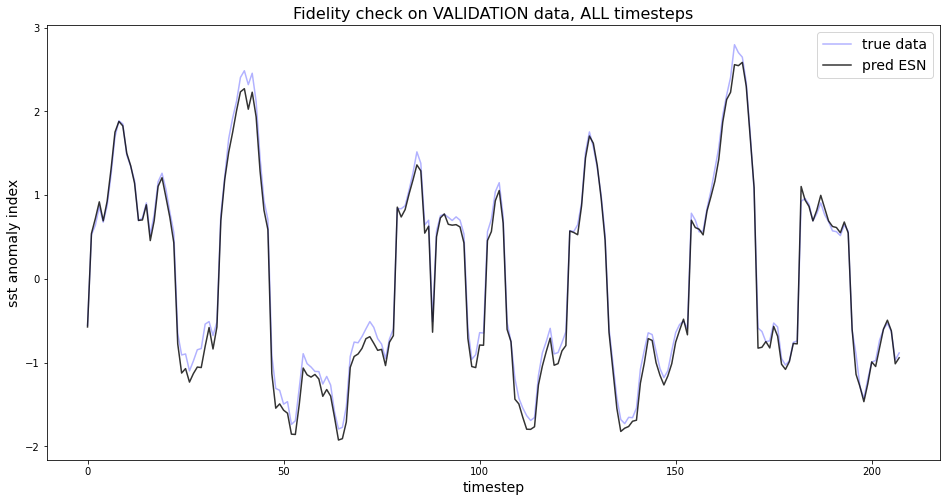

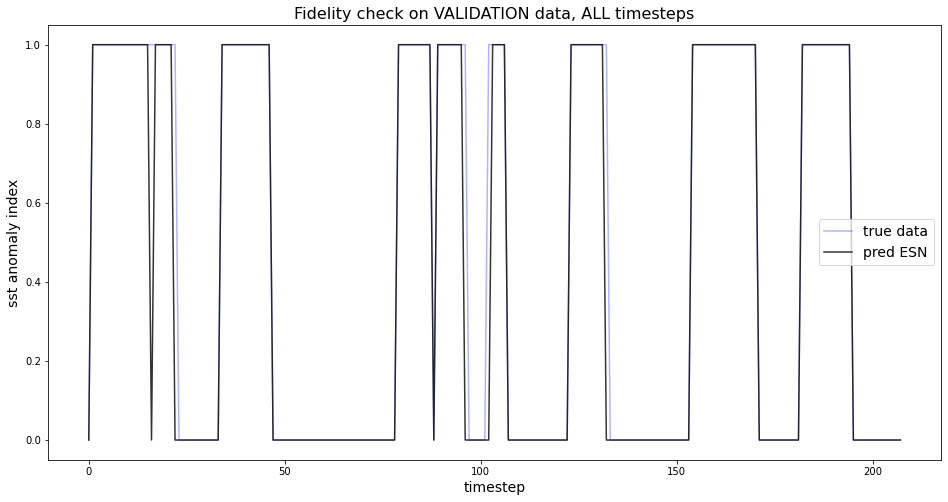


Validation accuracy:
El Nino:  0.95
La Nina:  1.0

Train accuracy:
El Nino:  1.0
La Nina:  1.0


In [101]:
# Convert to binary prediction:
train_pred_bin = (train_pred > 0.5)
val_pred_bin = (val_pred > 0.5)

if verbose:   
    # Fidelity check: Plot val_pred vs. val_targets, but only the first 60 timesteps
    plt.figure(figsize=(16,8))
    plt.plot(range(len(val_target[:60,0])),val_target[:60,0],'b',label="true data", alpha=0.3)
    plt.plot(range(len(val_pred[:60,0])),val_pred[:60,0],'k',  alpha=0.8, label='pred ESN')
    plt.title('Fidelity check on VALIDATION data, first 60 timesteps', fontsize=16)
    plt.xlabel('timestep', fontsize=14)
    plt.ylabel('sst anomaly index', fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    # Fidelity check: Plot val_pred vs. val_targets, ALL timesteps
    plt.figure(figsize=(16,8))
    plt.plot(range(len(val_target[:,0])),val_target[:,0],'b',label="true data", alpha=0.3)
    plt.plot(range(len(val_pred[:,0])),val_pred[:,0],'k',  alpha=0.8, label='pred ESN')
    plt.title('Fidelity check on VALIDATION data, ALL timesteps', fontsize=16)
    plt.xlabel('timestep', fontsize=14)
    plt.ylabel('sst anomaly index', fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    # Fidelity check: Plot val_pred_bin vs. val_targetbin, ALL timesteps
    plt.figure(figsize=(16,8))
    plt.plot(range(len(val_target_bin[:,0])),val_target_bin[:,0],'b',label="true data", alpha=0.3)
    plt.plot(range(len(val_pred_bin[:,0])),val_pred_bin[:,0],'k',  alpha=0.8, label='pred ESN')
    plt.title('Fidelity check on VALIDATION data, ALL timesteps', fontsize=16)
    plt.xlabel('timestep', fontsize=14)
    plt.ylabel('sst anomaly index', fontsize=14)
    plt.legend(fontsize=14)
    plt.show()    


## Check accuracy: How often is the correct label predicted?
## Note: Accurate prediction means having a certain event (e.g. El Nino) and correctly predicting 
## to have that same event.

# Get validation accuracy: Rel. amount of correctly predicted events.
val_acc_ElNino = sum((val_pred_bin[:,0] == val_target_bin[:,0]) & (val_target_bin[:,0] == 1)) / sum(val_target_bin[:,0] == 1)
val_acc_LaNina = sum((val_pred_bin[:,0] == val_target_bin[:,0]) & (val_target_bin[:,0] == 0)) / sum(val_target_bin[:,0] == 0)

# Get train accuracy: Rel. amount of correctly predicted events.
train_acc_ElNino = sum((train_pred_bin[:,0] == train_target_bin[:,0]) & (train_target_bin[:,0] == 1)) / sum(train_target_bin[:,0] == 1)
train_acc_LaNina = sum((train_pred_bin[:,0] == train_target_bin[:,0]) & (train_target_bin[:,0] == 0)) / sum(train_target_bin[:,0] == 0)


if verbose:
    print("\nValidation accuracy:")
    print("El Nino: ", np.round(val_acc_ElNino,2))
    print("La Nina: ", np.round(val_acc_LaNina,2))

    print("\nTrain accuracy:")
    print("El Nino: ", np.round(train_acc_ElNino,2))
    print("La Nina: ", np.round(train_acc_LaNina,2))

### Ensemble of coupled ESN models

If we train only a single coupled ESN model, we find quite stable accuracy of 90% / 100% for El Nino / La Nina on validation data and perfection on train data. The idea is now to train three models and create an ensemble, either by taking the average prediction as model prediction (continuous) or the majority vote (binary).

In [89]:
# temporarily store predictions from first training run:
train_pred_1 = np.copy(train_pred)
val_pred_1 = np.copy(val_pred)

In [93]:
# temporarily store predictions from second training run:
train_pred_2 = np.copy(train_pred)
val_pred_2 = np.copy(val_pred)

In [81]:
# temporarily store predictions from second training run:
train_pred_3 = np.copy(train_pred)
val_pred_3 = np.copy(val_pred)

In [82]:
# get average prediction
train_pred = (train_pred_1 + train_pred_2 + train_pred_3) / 3
val_pred = (val_pred_1 + val_pred_2 + val_pred_3) / 3

# Convert to binary prediction:
train_pred_bin = (train_pred > 0.5)
val_pred_bin = (val_pred > 0.5)

# Get validation accuracy: Rel. amount of correctly predicted events.
val_acc_ElNino = sum((val_pred_bin[:,0] == val_target_bin[:,0]) & (val_target_bin[:,0] == 1)) / sum(val_target_bin[:,0] == 1)
val_acc_LaNina = sum((val_pred_bin[:,0] == val_target_bin[:,0]) & (val_target_bin[:,0] == 0)) / sum(val_target_bin[:,0] == 0)

# Get train accuracy: Rel. amount of correctly predicted events.
train_acc_ElNino = sum((train_pred_bin[:,0] == train_target_bin[:,0]) & (train_target_bin[:,0] == 1)) / sum(train_target_bin[:,0] == 1)
train_acc_LaNina = sum((train_pred_bin[:,0] == train_target_bin[:,0]) & (train_target_bin[:,0] == 0)) / sum(train_target_bin[:,0] == 0)


if verbose:
    print("\nValidation accuracy:")
    print("El Nino: ", np.round(val_acc_ElNino,2))
    print("La Nina: ", np.round(val_acc_LaNina,2))

    print("\nTrain accuracy:")
    print("El Nino: ", np.round(train_acc_ElNino,2))
    print("La Nina: ", np.round(train_acc_LaNina,2))


Validation accuracy:
El Nino:  0.97
La Nina:  1.0

Train accuracy:
El Nino:  1.0
La Nina:  1.0


In [83]:
## now try majority vote from binary prediction

# Convert to binary prediction:
train_pred_1_bin = (train_pred_1 > 0.5)
train_pred_2_bin = (train_pred_2 > 0.5)
train_pred_3_bin = (train_pred_3 > 0.5)
val_pred_1_bin = (val_pred_1 > 0.5)
val_pred_2_bin = (val_pred_2 > 0.5)
val_pred_3_bin = (val_pred_3 > 0.5)

# take majority vote as ensemble prediction: If at least two models vote for El Nino, its El Nino, else La Nina
train_pred_bin = (train_pred_1_bin.astype(int) + train_pred_2_bin.astype(int) + train_pred_3_bin.astype(int)) >= 2
val_pred_bin = (val_pred_1_bin.astype(int) + val_pred_2_bin.astype(int) + val_pred_3_bin.astype(int)) >= 2

# Get validation accuracy: Rel. amount of correctly predicted events.
val_acc_ElNino = sum((val_pred_bin[:,0] == val_target_bin[:,0]) & (val_target_bin[:,0] == 1)) / sum(val_target_bin[:,0] == 1)
val_acc_LaNina = sum((val_pred_bin[:,0] == val_target_bin[:,0]) & (val_target_bin[:,0] == 0)) / sum(val_target_bin[:,0] == 0)

# Get train accuracy: Rel. amount of correctly predicted events.
train_acc_ElNino = sum((train_pred_bin[:,0] == train_target_bin[:,0]) & (train_target_bin[:,0] == 1)) / sum(train_target_bin[:,0] == 1)
train_acc_LaNina = sum((train_pred_bin[:,0] == train_target_bin[:,0]) & (train_target_bin[:,0] == 0)) / sum(train_target_bin[:,0] == 0)


if verbose:
    print("\nValidation accuracy:")
    print("El Nino: ", np.round(val_acc_ElNino,2))
    print("La Nina: ", np.round(val_acc_LaNina,2))

    print("\nTrain accuracy:")
    print("El Nino: ", np.round(train_acc_ElNino,2))
    print("La Nina: ", np.round(train_acc_LaNina,2))


Validation accuracy:
El Nino:  0.97
La Nina:  1.0

Train accuracy:
El Nino:  1.0
La Nina:  1.0


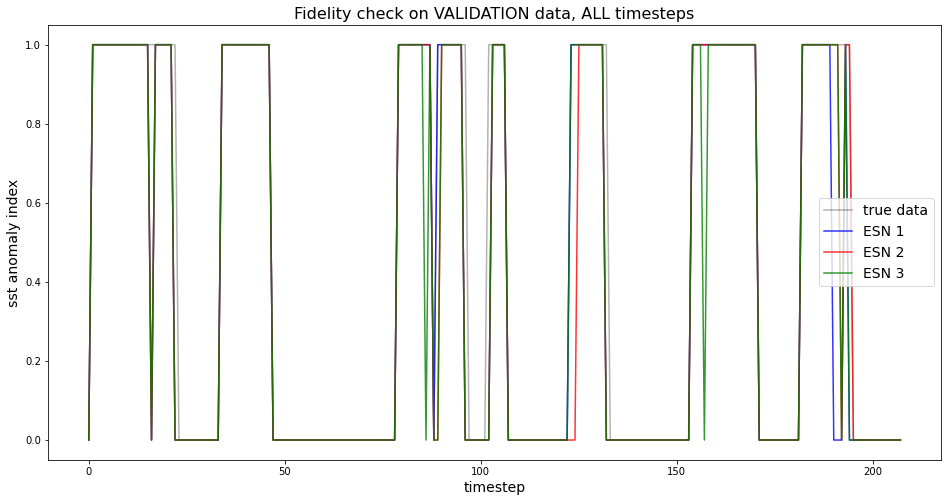

In [60]:
# Fidelity check: Plot binary predictions from multiple training runs to see, if models fail on the same samples.
plt.figure(figsize=(16,8))
plt.plot(range(len(val_target_bin[:,0])),val_target_bin[:,0],'k',label="true data", alpha=0.3)
plt.plot(range(len(val_pred_1_bin[:,0])),val_pred_1_bin[:,0],'b',  alpha=0.8, label='ESN 1')
plt.plot(range(len(val_pred_2_bin[:,0])),val_pred_2_bin[:,0],'r',  alpha=0.8, label='ESN 2')
plt.plot(range(len(val_pred_3_bin[:,0])),val_pred_3_bin[:,0],'g',  alpha=0.8, label='ESN 3')
plt.title('Fidelity check on VALIDATION data, ALL timesteps', fontsize=16)
plt.xlabel('timestep', fontsize=14)
plt.ylabel('sst anomaly index', fontsize=14)
plt.legend(fontsize=14)
plt.show()

### Discussion: Ensemble of coupled ESN models

Note: The coupled ESN approach seems to struggle only with El Nino samples having a nomalized sst anomaly index value of only slightly above threshold (0.5) in VALIDATION data. For all other samples we usually find perfection. Hence **only state the validation accuracy for El Nino samples** below:

- With $T=2$ timesteps, accuracy is observed to fluctuate: 94% / 88% / 82%
- With $T=3$ timesteps, things stabilize, we find: 91% / 91% / [87%] / 90% --> avg: 91%, majority vote: 92%
- With $T=4$ timesteps, accuracy is found to be best: 97% / 97% / [87%] / 95% --> avg: 97%, majority vote: 97%
- With $T=5$ timesteps, accuracy starts to fluctuate again: 98% / 93% / 91%

**T=4 timesteps** seems to be optimal.

### LRP on coupled baseESN

Nevertheless we are interested in relevance maps from our coupled baseESN. So stick to $T=3$ timesteps and try LRP. In our setup we worked with leak_rate $\alpha=1$ to simplify reservoir state transition to:

$$x(t=1) = act[u(t=1)W_{in}]$$ and $$x(t>1) = act[x(t-1)W_{res}]$$

since we also set input and reservoir biases to zero. Have **one-hot** targets. Compute relevance separately for both output units, hence for El Nino / La Nina samples separately. From third part of this experiment (**--> ESN_exp08_LRP_part3.ipynb**) we know to use the following propagation rule to pass information backward from layer $j$ to previous layer $i$:

$$R_i = \sum_j \frac{z_{ij}^+}{\sum_i z_{ij}^+}R_j$$

Here we only take positive contributions of pre-activations $z_{ij}^+ = (a_i w_{ij})^+$ into account. Aim to find some nice and reasonable structure in relevance map, **highlighting Nino region**,.

Sample dimensions and prediction:
raw sample shape (1, timesteps, features):  (1, 4, 2772)
number of timesteps:  4
number of input features in_feat:  2772
number of res. units n_res:  2772
leak rate alpha:  1
model prediction on sample:  -1.854

Model weights and biases, Dimensions:
input weights W_in (input features, res. units):  (2772, 2772)
input biases b_in (res. units):  (2772,)
reservoir weights W_res (res. units, res. units):  (2772, 2772)
reservoir biases b_res (res. units):  (2772,)
output weights W_out (res. units, output features):  (2772, 1)
output biases b_out (output features):  (1,)

Tensor shapes:
input tensor U (timesteps, input features):  (4, 2772)
all res. states X (timesteps, res. units):  (4, 2772)
activations ACT (timesteps, res. units):  (4, 2772)


/var/folders/jv/p__lpnd50w93ff78f84hkwkh7fs9_f/T/ipykernel_850/2923513253.py:46: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())


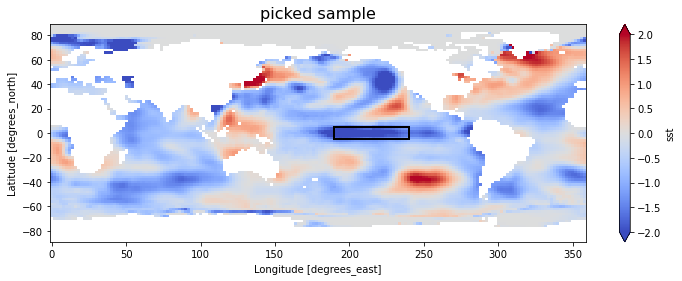

In [108]:
### Pick out ONE El Nino sample to be analysed:
#sample_id = 40 # number 40 of validation inputs --> El Nino sample
sample_id = 52 # number 52 of validation inputs --> La Nina sample
sample = val_input_adj[sample_id:sample_id+1,:,:]

## If feeding the sample column-wise is desired, need to swap lat <-> lon for input sample:
#sample = np.swapaxes(sample, 1, 2)

# Plot sample input in its original size
fig, ax = plt.subplots(figsize=(12, 4))
sst_anomaly_fields_NinoNina[sample_id].name = 'sst anomaly deg Celsius'
sst_anomaly_fields_NinoNina[sample_id].plot(ax=ax, cmap='coolwarm', vmax=2, vmin=-2)
plt.title('picked sample', fontsize=16)

# Create a Rectangle patch and add the patch to the Axes
rect = patches.Rectangle((190, -5), 50, 10, linewidth=2, edgecolor='black', facecolor='none')
ax.add_patch(rect)

# Extract number of timesteps (timesteps) and variable T to loop over.
# Note: Subtract 1 from absolute number of timesteps to get T, since loops start at 0.
timesteps = sample.shape[1]
T = timesteps - 1

# Extract number of input features:
in_feat = sample.shape[2]

# Rename leak_rate to 'a' for convenience and readability of LRP algorithm:
a = leak_rate

# Have trained model as pre-requisite. For BOTH output units (El Nino / La Nina) check prediction on picked sample:
pred = model.predict(sample)

## Check dimensions and prediction:
print("Sample dimensions and prediction:")
print("=================================")
print("raw sample shape (1, timesteps, features): ", sample.shape)
print("number of timesteps: ", timesteps)
print("number of input features in_feat: ", in_feat)
print("number of res. units n_res: ", n_res)
print("leak rate alpha: ", a)
print("model prediction on sample: ", np.round(pred[0,0],3))

### Extract model weights from trained model:

## Get all weights:
model_weights = np.array(model.get_weights())

### Extract input / reservoir / output weights and bias(es):

## Note: Have reservoir weights only in case of input_length > 1, here T > 0.

if T > 0:
    W_in = model_weights[0]
    b_in = model_weights[1]
    W_res = model_weights[2]
    b_res = model_weights[3]
    W_out = model_weights[4]
    b_out = model_weights[5]
    
    ## Check dimensions:
    print("\nModel weights and biases, Dimensions:")
    print("=====================================")
    print("input weights W_in (input features, res. units): ", W_in.shape)
    print("input biases b_in (res. units): ", b_in.shape)
    print("reservoir weights W_res (res. units, res. units): ", W_res.shape)
    print("reservoir biases b_res (res. units): ", b_res.shape)
    print("output weights W_out (res. units, output features): ", W_out.shape)
    print("output biases b_out (output features): ", b_out.shape)

else:
    W_in = model_weights[0]
    b_in = model_weights[1]
    W_out = model_weights[2]
    b_out = model_weights[3]

    ## Check dimensions:
    print("\nModel weights and biases, Dimensions:")
    print("=====================================")
    print("input weights W_in (input features, res. units): ", W_in.shape)
    print("input biases b_in (res. units): ", b_in.shape)
    print("output weights W_out (res. units, output features): ", W_out.shape)
    print("output biases b_out (output features): ", b_out.shape)

## Set tensors for inputs U, activation layer ACT and all reservoir states X:

# Get inputs U for all timesteps from raw input sample by just omitting first dimension (=sample number):
U = sample[0,:,:]

# Get all reservoir states for all timesteps X on picked sample, omit first dimension (=sample number):
X = all_states.predict(sample)[0,:,:]

# Get X' from all reservoir states X, shifted by one timestep and adding ZEROs as first row:
X_prime = np.concatenate([np.zeros((1,n_res)),X[:-1,:]], axis=0)

# Get activation layer ACT from relation: X = (1 - alpha) * X_prime + alpha * ACT
ACT = (X - (1 - a) * X_prime) / a

# Check dimensions:
print("\nTensor shapes:")
print("==============")
print("input tensor U (timesteps, input features): ", U.shape)
print("all res. states X (timesteps, res. units): ", X.shape)
print("activations ACT (timesteps, res. units): ", ACT.shape)

In [103]:
sample.shape

(1, 4, 2772)

In [109]:
## Transform flattend sample back to its original 2D lat x lon grid:

# Initialize storage, take original lat / lon shape from valid gridpoints' shape:
sample_restored = np.zeros(valid_gridpoints_small[0].shape)

# count variable for running through flattened vector of valid values:
k = 0

# Loop over latitude
for i in range(valid_gridpoints_small[0].shape[0]):
    # Loop over longitude
    for j in range(valid_gridpoints_small[0].shape[1]):
        if valid_gridpoints_small[0][i,j]==1:
            sample_restored[i,j]=sample[0,0,k]
            k += 1
            
# Set weights of former NaN values' gridpoints to -1, to highlight continents' shapes
sample_restored[valid_gridpoints_small[0]==0] = -1

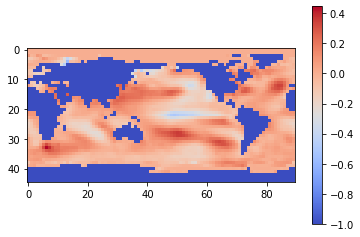

In [110]:
# Plot sample in reduced size:
plt.imshow(sample_restored, cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

In [106]:
### LRP on coupled baseESN: Only take positive contributions of pre-potential into account.
### EL NINO

## NOTE: Use first output units prediction!

## Start with layer T

# Get relevances R_i and first part of R_j for n_res units x_i in ACT(T) and x_j in X(T-1), respectively,
# connecting to OUTPUT unit x_o:
R_i = (a * (np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0]) /
       sum((np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])) * pred[0,0])
R_j_1 = ((1 - a) * (np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])
         / sum((np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])) * pred[0,0])

### Only in case of input_lenght > 1, hence T > 0:
if T > 0:    
    
    # Get relevances R_k for in_feat input units x_k of U(T)
    R_k = np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)
                 / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)


    # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
    R_j_2 = np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)
    / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

    # Combine both contributions for relevance R_j, for n_res units x_j of X(T-1):
    R_j = R_j_1 + R_j_2

    # Store other relevances for plausibility check:
    R_i_sum = []
    R_j_sum = []
    R_k_sum = []
    R_j_1_sum = []
    R_j_2_sum = []
    R_i_sum.append(sum(R_i))
    R_j_sum.append(sum(R_j))
    R_k_sum.append(sum(R_k))
    R_j_1_sum.append(sum(R_j_1))
    R_j_2_sum.append(sum(R_j_2))

    ### Now loop over remaining T-1 layers in decreasing order. Start with T-1, stop at first layer, since that needs
    ### special treatment.
    for t in np.flip(np.arange(1,T)):

        # Get relevances R_i for n_res units x_i of ACT(t). Note: Each unit x_i is only connected to a
        # single corresponding unit x_m of X(t), multiplied by alpha. 
        # No additional weights and bias in this connection, hence w=1 and b=0.
        R_i = a * R_j

        # The same holds true for first part of relevances R_j_1 for n_res units x_j of X(t-1) connecting to
        # n_res units x_m of X(t), multiplied by (1-alpha), no weights and bias.
        R_j_1 = (1 - a) * R_j

        # Get relevances R_k for in_feat input units x_k of U(T)
        R_k = np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)
                     / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                        + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

        # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
        R_j_2 = np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)
        / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                        + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

        # Combine both contributions for relevance R_j, for n_res units x_j of X(t-1):
        R_j = R_j_1 + R_j_2

        # Store other relevances for plausibility check:
        R_i_sum.append(sum(R_i))
        R_j_sum.append(sum(R_j))
        R_k_sum.append(sum(R_k))
        R_j_1_sum.append(sum(R_j_1))
        R_j_2_sum.append(sum(R_j_2))

    ## Now take care of first timestep: In this step we only feed the inputs into the model. There is no recursion
    ## of reservoir states, since X(0) doesn't exist.

    # Get relevances R_i for n_res units x_i of ACT(1). Note: Each unit x_i is only connected to a
    # single corresponding unit x_m of X(1), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_i = a * R_j

    # Get relevances R_k for in_feat input units x_k of U(1). Note: Each input is only connected to a
    # single corresponding value of ACT(1), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_k = R_i

### In case of of input_length = 1: 
else:    

    # Get relevances R_k for in_feat input units x_k of U(1). Note: Each input is only connected to a
    # single corresponding value of ACT(1), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_k = R_i

    # Store other relevances for plausibility check:
    R_i_sum = []
    R_k_sum = []
    R_i_sum.append(sum(R_i))
    R_k_sum.append(sum(R_k))
    
## Transform flattend relevance map back to its original 2D lat x lon grid:

# Initialize storage, take original lat / lon shape from valid gridpoints' shape:
R_k_restored = np.zeros(valid_gridpoints_small[0].shape)

# count variable for running through flattened vector of valid values:
k = 0

# Loop over latitude
for i in range(valid_gridpoints_small[0].shape[0]):
    # Loop over longitude
    for j in range(valid_gridpoints_small[0].shape[1]):
        if valid_gridpoints_small[0][i,j]==1:
            R_k_restored[i,j]=R_k[k]
            k += 1
            
# Plausibility check, whether Layer relevance is conserved:
print("sum of relevance R_i: ", np.round(sum(R_i), 3))
print("sum of relevance R_j: ", np.round(sum(R_j), 3))
print("sum of relevance R_k: ", np.round(sum(R_k), 3))

sum of relevance R_i:  2.271
sum of relevance R_j:  2.271
sum of relevance R_k:  2.271


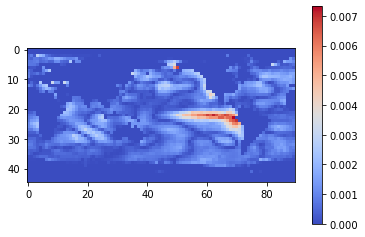

In [107]:
# Relevance heatmap
plt.imshow(R_k_restored, cmap='coolwarm', interpolation='nearest')#, vmax=0.001)
plt.colorbar()
plt.show()

In [111]:
### LRP on coupled baseESN: LA NINA
### Since we work with single continuous target, take inverse prediction (= positive) as final relevance.
### Then only take negative contributions of pre-potential into account.


## Start with layer T

# Get relevances R_i and first part of R_j for n_res units x_i in ACT(T) and x_j in X(T-1), respectively,
# connecting to first OUTPUT unit x_o:
R_i = (a * (np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0]) /
       sum((np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0])) * -pred[0,0])
R_j_1 = ((1 - a) * (np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0])
         / sum((np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0])) * -pred[0,0])

### Only in case of input_lenght > 1, hence T > 0:
if T > 0:  
    
    # Get relevances R_k for in_feat input units x_k of U(T)
    R_k = np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)
                 / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)


    # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
    R_j_2 = np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)
    / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

    # Combine both contributions for relevance R_j, for n_res units x_j of X(T-1):
    R_j = R_j_1 + R_j_2

    # Store other relevances for plausibility check:
    R_i_sum = []
    R_j_sum = []
    R_k_sum = []
    R_j_1_sum = []
    R_j_2_sum = []
    R_i_sum.append(sum(R_i))
    R_j_sum.append(sum(R_j))
    R_k_sum.append(sum(R_k))
    R_j_1_sum.append(sum(R_j_1))
    R_j_2_sum.append(sum(R_j_2))

    ### Now loop over remaining T-1 layers in decreasing order. Start with T-1, stop at first layer, since that needs
    ### special treatment.
    for t in np.flip(np.arange(1,T)):

        # Get relevances R_i for n_res units x_i of ACT(t). Note: Each unit x_i is only connected to a
        # single corresponding unit x_m of X(t), multiplied by alpha. 
        # No additional weights and bias in this connection, hence w=1 and b=0.
        R_i = a * R_j

        # The same holds true for first part of relevances R_j_1 for n_res units x_j of X(t-1) connecting to
        # n_res units x_m of X(t), multiplied by (1-alpha), no weights and bias.
        R_j_1 = (1 - a) * R_j

        # Get relevances R_k for in_feat input units x_k of U(T)
        R_k = np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)
                     / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                        + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

        # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
        R_j_2 = np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)
        / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                        + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

        # Combine both contributions for relevance R_j, for n_res units x_j of X(t-1):
        R_j = R_j_1 + R_j_2

        # Store other relevances for plausibility check:
        R_i_sum.append(sum(R_i))
        R_j_sum.append(sum(R_j))
        R_k_sum.append(sum(R_k))
        R_j_1_sum.append(sum(R_j_1))
        R_j_2_sum.append(sum(R_j_2))

    ## Now take care of first timestep: In this step we only feed the inputs into the model. There is no recursion
    ## of reservoir states, since X(0) doesn't exist.

    # Get relevances R_i for n_res units x_i of ACT(1). Note: Each unit x_i is only connected to a
    # single corresponding unit x_m of X(1), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_i = a * R_j

    # Get relevances R_k for in_feat input units x_k of U(1). Note: Each input is only connected to a
    # single corresponding value of ACT(1), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_k = R_i
    
### In case of of input_length = 1: 
else:    

    # Get relevances R_k for in_feat input units x_k of U(1). Note: Each input is only connected to a
    # single corresponding value of ACT(1), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_k = R_i

    # Store other relevances for plausibility check:
    R_i_sum = []
    R_k_sum = []
    R_i_sum.append(sum(R_i))
    R_k_sum.append(sum(R_k))
    
## Transform flattend relevance map back to its original 2D lat x lon grid:

# Initialize storage, take original lat / lon shape from valid gridpoints' shape:
R_k_restored = np.zeros(valid_gridpoints_small[0].shape)

# count variable for running through flattened vector of valid values:
k = 0

# Loop over latitude
for i in range(valid_gridpoints_small[0].shape[0]):
    # Loop over longitude
    for j in range(valid_gridpoints_small[0].shape[1]):
        if valid_gridpoints_small[0][i,j]==1:
            R_k_restored[i,j]=R_k[k]
            k += 1
            
# Plausibility check, whether Layer relevance is conserved:
print("sum of relevance R_i: ", np.round(sum(R_i), 3))
print("sum of relevance R_j: ", np.round(sum(R_j), 3))
print("sum of relevance R_k: ", np.round(sum(R_k), 3))

sum of relevance R_i:  1.854
sum of relevance R_j:  1.854
sum of relevance R_k:  1.854


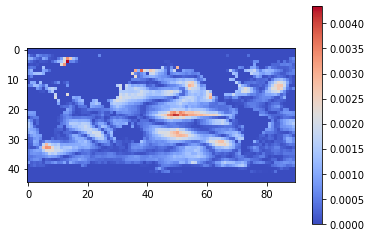

In [112]:
# Plot relevance map
plt.imshow(R_k_restored, cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

### Coupled baseESN: Get mean relevance maps for ALL El Nino / La Nina samples (from train inputs)

In [115]:
### LRP with coupled baseESN on ALL El Nino samples (from train inputs)

verbose=False

## Split train inputs into El Nino / La Nina samples, according to binary target:
samples_ElNino = train_input_adj[(train_target_bin==1)[:,0]]

## Split targets accordingly:
targets_ElNino = train_target[(train_target_bin==1)[:,0]]

if verbose:
    print("samples_ElNino shape: ", samples_ElNino.shape)

# Extract number of timesteps (timesteps) and variable T to loop over.
# Note: Subtract 1 from absolute number of timesteps to get T, since loops start at 0.
timesteps = samples_ElNino.shape[1]
T = timesteps - 1

# Extract number of input features:
in_feat = samples_ElNino.shape[2]

# Rename leak_rate to 'a' for convenience and readability of LRP algorithm:
a = leak_rate

### Extract model weights from trained model:

## Get all weights:
model_weights = np.array(model.get_weights())

## Set input / reservoir / output weights and bias(es):
W_in = model_weights[0]
b_in = model_weights[1]
W_res = model_weights[2]
b_res = model_weights[3]
W_out = model_weights[4]
b_out = model_weights[5]

## Initialize storage for mean relevance over all ElNino samples.
R_all_mean = np.zeros(in_feat)
    
#Loop over El Nino samples:
for sample_id in range(len(samples_ElNino)):
    
    # Print status:
    print ("sample: ", sample_id+1, " from ", len(samples_ElNino))
    
    # Get current sample:
    sample = samples_ElNino[sample_id:sample_id+1]
    
    # Have trained model as pre-requisite. Check prediction and target on picked sample:
    pred = model.predict(sample)
    
    ## Set tensors for inputs U, activation layer ACT and all reservoir states X:

    # Get inputs U for all timesteps from raw input sample by just omitting first dimension (=sample number):
    U = sample[0,:,:]

    # Get all reservoir states for all timesteps X on picked sample, omit first dimension (=sample number):
    X = all_states.predict(sample)[0,:,:]

    # Get X' from all reservoir states X, shifted by one timestep and adding ZEROs as first row:
    X_prime = np.concatenate([np.zeros((1,n_res)),X[:-1,:]], axis=0)

    # Get activation layer ACT from relation: X = (1 - alpha) * X_prime + alpha * ACT
    ACT = (X - (1 - a) * X_prime) / a
    
    ### LRP on baseESN: Second attempt, only consider positive contributions of pre-potential into account.

    ## Start with layer T

    # Get relevances R_i and first part of R_j for n_res units x_i in ACT(T) and x_j in X(T-1), respectively,
    # connecting to first OUTPUT unit x_o:
    R_i = (a * (np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0]) /
           sum((np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])) * pred[0,0])
    R_j_1 = ((1 - a) * (np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])
             / sum((np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])) * pred[0,0])

    # Get relevances R_k for in_feat input units x_k of U(T)
    R_k = np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)
                 / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)


    # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
    R_j_2 = np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)
    / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

    # Combine both contributions for relevance R_j, for n_res units x_j of X(T-1):
    R_j = R_j_1 + R_j_2

    # Store other relevances for plausibility check:
    R_i_sum = []
    R_j_sum = []
    R_k_sum = []
    R_j_1_sum = []
    R_j_2_sum = []
    R_i_sum.append(sum(R_i))
    R_j_sum.append(sum(R_j))
    R_k_sum.append(sum(R_k))
    R_j_1_sum.append(sum(R_j_1))
    R_j_2_sum.append(sum(R_j_2))

    ### Now loop over remaining T-1 layers in decreasing order. Start with T-1, stop at first layer, since that needs
    ### special treatment.
    for t in np.flip(np.arange(1,T)):

        # Get relevances R_i for n_res units x_i of ACT(t). Note: Each unit x_i is only connected to a
        # single corresponding unit x_m of X(t), multiplied by alpha. 
        # No additional weights and bias in this connection, hence w=1 and b=0.
        R_i = a * R_j

        # The same holds true for first part of relevances R_j_1 for n_res units x_j of X(t-1) connecting to
        # n_res units x_m of X(t), multiplied by (1-alpha), no weights and bias.
        R_j_1 = (1 - a) * R_j

        # Get relevances R_k for in_feat input units x_k of U(T)
        R_k = np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)
                     / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                        + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

        # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
        R_j_2 = np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)
        / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                        + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

        # Combine both contributions for relevance R_j, for n_res units x_j of X(t-1):
        R_j = R_j_1 + R_j_2

        # Store other relevances for plausibility check:
        R_i_sum.append(sum(R_i))
        R_j_sum.append(sum(R_j))
        R_k_sum.append(sum(R_k))
        R_j_1_sum.append(sum(R_j_1))
        R_j_2_sum.append(sum(R_j_2))

    ## Now take care of first timestep: In this step we only feed the inputs into the model. There is no recursion
    ## of reservoir states, since X(0) doesn't exist.

    # Get relevances R_i for n_res units x_i of ACT(1). Note: Each unit x_i is only connected to a
    # single corresponding unit x_m of X(1), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_i = a * R_j

    # Get relevances R_k for in_feat input units x_k of U(1). Note: Each input is only connected to a
    # single corresponding value of ACT(1), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_k = R_i
        
    ## Add relevance for current sample to storage for ALL samples:
    R_all_mean += R_k

## Get mean relevance over ALL samples:
R_all_mean_nino = R_all_mean / len(samples_ElNino)

## Transform flattend relevance map back to its original 2D lat x lon grid:

# Initialize storage, take original lat / lon shape from valid gridpoints' shape:
R_mean_nino_restored = np.zeros(valid_gridpoints_small[0].shape)

# count variable for running through flattened vector of valid values:
k = 0

# Loop over latitude
for i in range(valid_gridpoints_small[0].shape[0]):
    # Loop over longitude
    for j in range(valid_gridpoints_small[0].shape[1]):
        if valid_gridpoints_small[0][i,j]==1:
            R_mean_nino_restored[i,j]=R_all_mean_nino[k]
            k += 1
            

/var/folders/jv/p__lpnd50w93ff78f84hkwkh7fs9_f/T/ipykernel_850/1587005024.py:28: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())


sample:  1  from  195
sample:  2  from  195
sample:  3  from  195
sample:  4  from  195
sample:  5  from  195
sample:  6  from  195
sample:  7  from  195
sample:  8  from  195
sample:  9  from  195
sample:  10  from  195
sample:  11  from  195
sample:  12  from  195
sample:  13  from  195
sample:  14  from  195
sample:  15  from  195
sample:  16  from  195
sample:  17  from  195
sample:  18  from  195
sample:  19  from  195
sample:  20  from  195
sample:  21  from  195
sample:  22  from  195
sample:  23  from  195
sample:  24  from  195
sample:  25  from  195
sample:  26  from  195
sample:  27  from  195
sample:  28  from  195
sample:  29  from  195
sample:  30  from  195
sample:  31  from  195
sample:  32  from  195
sample:  33  from  195
sample:  34  from  195
sample:  35  from  195
sample:  36  from  195
sample:  37  from  195
sample:  38  from  195
sample:  39  from  195
sample:  40  from  195
sample:  41  from  195
sample:  42  from  195
sample:  43  from  195
sample:  44  from  1

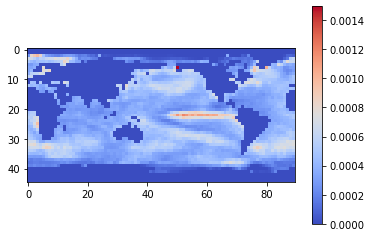

In [116]:
# Coupled baseESN, tanh activation, T=4
# Mean relevance heatmap El Nino, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1], remove_NaN = True
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_mean_nino_restored, cmap='coolwarm', interpolation='nearest')#, vmax=0.0005)
plt.colorbar()
plt.show()

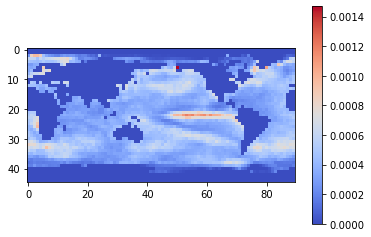

In [42]:
# Coupled baseESN, tanh activation, T=3
# Mean relevance heatmap El Nino, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1], remove_NaN = True
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_mean_nino_restored, cmap='coolwarm', interpolation='nearest')#, vmax=0.0005)
plt.colorbar()
plt.show()

In [113]:
### LRP with coupled baseESN on ALL La Nina samples (from train inputs)

verbose=False

## Split train inputs into El Nino / La Nina samples, according to binary target:
samples_LaNina = train_input_adj[(train_target_bin==0)[:,0]]

## Split targets accordingly:
targets_LaNina = train_target[(train_target_bin==0)[:,0]]

if verbose:
    print("samples_LaNina shape: ", samples_LaNina.shape)

# Extract number of timesteps (timesteps) and variable T to loop over.
# Note: Subtract 1 from absolute number of timesteps to get T, since loops start at 0.
timesteps = samples_LaNina.shape[1]
T = timesteps - 1

# Extract number of input features:
in_feat = samples_LaNina.shape[2]

# Rename leak_rate to 'a' for convenience and readability of LRP algorithm:
a = leak_rate

### Extract model weights from trained model:

## Get all weights:
model_weights = np.array(model.get_weights())

## Set input / reservoir / output weights and bias(es):
W_in = model_weights[0]
b_in = model_weights[1]
W_res = model_weights[2]
b_res = model_weights[3]
W_out = model_weights[4]
b_out = model_weights[5]

## Initialize storage for mean relevance over all ElNino samples.
R_all_mean = np.zeros(in_feat)
    
#Loop over El Nino samples:
for sample_id in range(len(samples_LaNina)):
    
    # Print status:
    print ("sample: ", sample_id+1, " from ", len(samples_LaNina))
    
    # Get current sample:
    sample = samples_LaNina[sample_id:sample_id+1]
    
    # Have trained model as pre-requisite. Check prediction and target on picked sample:
    pred = model.predict(sample)
    
    ## Set tensors for inputs U, activation layer ACT and all reservoir states X:

    # Get inputs U for all timesteps from raw input sample by just omitting first dimension (=sample number):
    U = sample[0,:,:]

    # Get all reservoir states for all timesteps X on picked sample, omit first dimension (=sample number):
    X = all_states.predict(sample)[0,:,:]

    # Get X' from all reservoir states X, shifted by one timestep and adding ZEROs as first row:
    X_prime = np.concatenate([np.zeros((1,n_res)),X[:-1,:]], axis=0)

    # Get activation layer ACT from relation: X = (1 - alpha) * X_prime + alpha * ACT
    ACT = (X - (1 - a) * X_prime) / a
    
    ### LRP on baseESN: Second attempt, only consider positive contributions of pre-potential into account.

    ## Start with layer T

    # Get relevances R_i and first part of R_j for n_res units x_i in ACT(T) and x_j in X(T-1), respectively,
    # connecting to first OUTPUT unit x_o:
    R_i = (a * (np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0]) /
           sum((np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0])) * -pred[0,0])
    R_j_1 = ((1 - a) * (np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0])
             / sum((np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0])) * -pred[0,0])

    # Get relevances R_k for in_feat input units x_k of U(T)
    R_k = np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)
                 / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)


    # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
    R_j_2 = np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)
    / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

    # Combine both contributions for relevance R_j, for n_res units x_j of X(T-1):
    R_j = R_j_1 + R_j_2

    # Store other relevances for plausibility check:
    R_i_sum = []
    R_j_sum = []
    R_k_sum = []
    R_j_1_sum = []
    R_j_2_sum = []
    R_i_sum.append(sum(R_i))
    R_j_sum.append(sum(R_j))
    R_k_sum.append(sum(R_k))
    R_j_1_sum.append(sum(R_j_1))
    R_j_2_sum.append(sum(R_j_2))

    ### Now loop over remaining T-1 layers in decreasing order. Start with T-1, stop at first layer, since that needs
    ### special treatment.
    for t in np.flip(np.arange(1,T)):

        # Get relevances R_i for n_res units x_i of ACT(t). Note: Each unit x_i is only connected to a
        # single corresponding unit x_m of X(t), multiplied by alpha. 
        # No additional weights and bias in this connection, hence w=1 and b=0.
        R_i = a * R_j

        # The same holds true for first part of relevances R_j_1 for n_res units x_j of X(t-1) connecting to
        # n_res units x_m of X(t), multiplied by (1-alpha), no weights and bias.
        R_j_1 = (1 - a) * R_j

        # Get relevances R_k for in_feat input units x_k of U(T)
        R_k = np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)
                     / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                        + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

        # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
        R_j_2 = np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)
        / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                        + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

        # Combine both contributions for relevance R_j, for n_res units x_j of X(t-1):
        R_j = R_j_1 + R_j_2

        # Store other relevances for plausibility check:
        R_i_sum.append(sum(R_i))
        R_j_sum.append(sum(R_j))
        R_k_sum.append(sum(R_k))
        R_j_1_sum.append(sum(R_j_1))
        R_j_2_sum.append(sum(R_j_2))

    ## Now take care of first timestep: In this step we only feed the inputs into the model. There is no recursion
    ## of reservoir states, since X(0) doesn't exist.

    # Get relevances R_i for n_res units x_i of ACT(1). Note: Each unit x_i is only connected to a
    # single corresponding unit x_m of X(1), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_i = a * R_j

    # Get relevances R_k for in_feat input units x_k of U(1). Note: Each input is only connected to a
    # single corresponding value of ACT(1), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_k = R_i
        
    ## Add relevance for current sample to storage for ALL samples:
    R_all_mean += R_k

## Get mean relevance over ALL samples:
R_all_mean_nina = R_all_mean / len(samples_LaNina)

## Transform flattend relevance map back to its original 2D lat x lon grid:

# Initialize storage, take original lat / lon shape from valid gridpoints' shape:
R_mean_nina_restored = np.zeros(valid_gridpoints_small[0].shape)

# count variable for running through flattened vector of valid values:
k = 0

# Loop over latitude
for i in range(valid_gridpoints_small[0].shape[0]):
    # Loop over longitude
    for j in range(valid_gridpoints_small[0].shape[1]):
        if valid_gridpoints_small[0][i,j]==1:
            R_mean_nina_restored[i,j]=R_all_mean_nina[k]
            k += 1
            

/var/folders/jv/p__lpnd50w93ff78f84hkwkh7fs9_f/T/ipykernel_850/3387365493.py:28: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())


sample:  1  from  636
sample:  2  from  636
sample:  3  from  636
sample:  4  from  636
sample:  5  from  636
sample:  6  from  636
sample:  7  from  636
sample:  8  from  636
sample:  9  from  636
sample:  10  from  636
sample:  11  from  636
sample:  12  from  636
sample:  13  from  636
sample:  14  from  636
sample:  15  from  636
sample:  16  from  636
sample:  17  from  636
sample:  18  from  636
sample:  19  from  636
sample:  20  from  636
sample:  21  from  636
sample:  22  from  636
sample:  23  from  636
sample:  24  from  636
sample:  25  from  636
sample:  26  from  636
sample:  27  from  636
sample:  28  from  636
sample:  29  from  636
sample:  30  from  636
sample:  31  from  636
sample:  32  from  636
sample:  33  from  636
sample:  34  from  636
sample:  35  from  636
sample:  36  from  636
sample:  37  from  636
sample:  38  from  636
sample:  39  from  636
sample:  40  from  636
sample:  41  from  636
sample:  42  from  636
sample:  43  from  636
sample:  44  from  6

sample:  347  from  636
sample:  348  from  636
sample:  349  from  636
sample:  350  from  636
sample:  351  from  636
sample:  352  from  636
sample:  353  from  636
sample:  354  from  636
sample:  355  from  636
sample:  356  from  636
sample:  357  from  636
sample:  358  from  636
sample:  359  from  636
sample:  360  from  636
sample:  361  from  636
sample:  362  from  636
sample:  363  from  636
sample:  364  from  636
sample:  365  from  636
sample:  366  from  636
sample:  367  from  636
sample:  368  from  636
sample:  369  from  636
sample:  370  from  636
sample:  371  from  636
sample:  372  from  636
sample:  373  from  636
sample:  374  from  636
sample:  375  from  636
sample:  376  from  636
sample:  377  from  636
sample:  378  from  636
sample:  379  from  636
sample:  380  from  636
sample:  381  from  636
sample:  382  from  636
sample:  383  from  636
sample:  384  from  636
sample:  385  from  636
sample:  386  from  636
sample:  387  from  636
sample:  388  fr

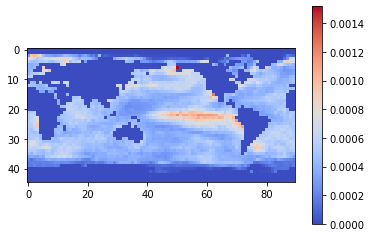

In [114]:
# Coupled baseESN, tanh activation, T=4
# Mean relevance heatmap El Nino, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1], remove_NaN = True
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_mean_nina_restored, cmap='coolwarm', interpolation='nearest')#, vmax=0.0005)
plt.colorbar()
plt.show()

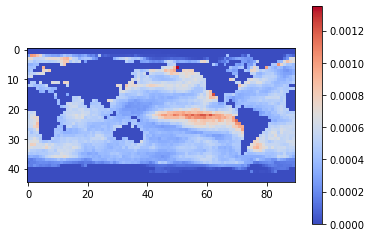

In [44]:
# Coupled baseESN, tanh activation, T=3
# Mean relevance heatmap El Nino, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1], remove_NaN = True
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_mean_nina_restored, cmap='coolwarm', interpolation='nearest')#, vmax=0.0005)
plt.colorbar()
plt.show()

### Classification with baseESN (column-wise) on single continuous target


#### Base parameter setup

* n_res = 300
* W_in_lim = 0.1
* leak_rate = 0.005
* spec_radius = 0.8
* sparsity = 0.3

Use these parameters on normalmized sst anomaly fields, **swapped longitude and latitude** and **scaled to [-1,1]** as inputs and **normalized sst anomaly index as single continuous target**, together with **tanh** activation. Multiplication with $\alpha$ is omitted in calculating first timestes's reservoir states (*leak_rate_first_step_YN = False*).

In [221]:
### Try classification of sst anomaly fields with base ESN. Define parameters for ESN model upfront
verbose = True
input_length = train_input_swap.shape[1] # Number of input timesteps, directly taken from inputs' shape.
n_layers = 1 # Number of ESN layers in the model.
n_res = 300 # Number of reservoir units.
W_in_lim = 0.1 # Initialize input weights from random uniform distribution in [- W_in_lim, + W_in_lim]
leak_rate = 0.005 # Leak rate used in transition function of reservoir states.
leak_rate_first_step_YN = False # If true, multiply with alpha already in calculating first timestes's res. states.
activation = 'tanh' # Desired activation function to be used in calculating reservoir state transition.
spec_radius = 0.8 # Spectral radius, becomes largest Eigenvalue of reservoir weight matrix.
sparsity = 0.3 # Sparsity of reservoir weight matrix.
in_features = train_input_swap.shape[2] # Number of input features, directly taken from inputs' shape.
out_features = 1 # E.g. 2 for classifying sst anomaly fields according to El Nino / La Nina events on one-hot targets.

/Users/mlandt-hayen/MarDATA/Python/EchoStateNetworks/notebooks/ESN_functions_v05.py:712: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())
/Users/mlandt-hayen/MarDATA/Python/EchoStateNetworks/notebooks/ESN_functions_v05.py:751: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_29 (InputLayer)        [(None, 180, 89)]         0         
_________________________________________________________________
esn_28 (ESN)                 ((None, 180, 300), (None, 117300    
_________________________________________________________________
output (Dense)               (None, 1)                 301       
Total params: 117,601
Trainable params: 117,601
Non-trainable params: 0
_________________________________________________________________
Model: "model_short"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_29 (InputLayer)        [(None, 180, 89)]         0         
_________________________________________________________________
esn_28 (ESN)                 ((None, 180, 300), (None, 117300    
Total params: 117,300
Trainable pa

/Users/mlandt-hayen/MarDATA/Python/EchoStateNetworks/notebooks/ESN_functions_v05.py:791: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())



shape of train input (samples, timesteps, input features):  (831, 180, 89)
shape of model output X_T (samples, n_res):  (831, 300)

Final reservoir states in augmented notation, shape:  (831, 301)

train_target shape (samples, output features):  (831, 1)

W_out shape:  (300, 1)
b_out shape:  (1,)

output feature  0 , trained b_out:  [40.11198527]


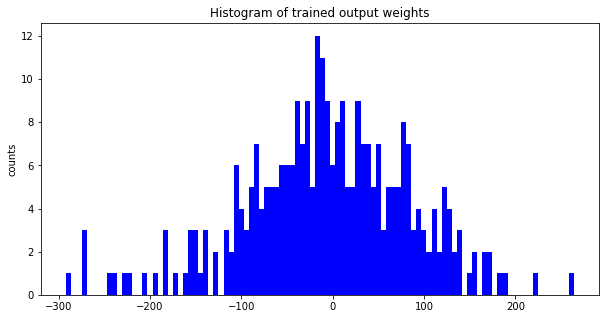


shape of val input (samples, timesteps, features):  (208, 180, 89)
shape of train input (samples, timesteps, features):  (831, 180, 89)

shape of model predictions on validation input (samples, 1):  (208, 1)
shape of val targets (samples, 1):  (208, 1)

train_mae:  0.1054
val_mae:  0.2438

train_mse:  0.017
val_mse:  0.133


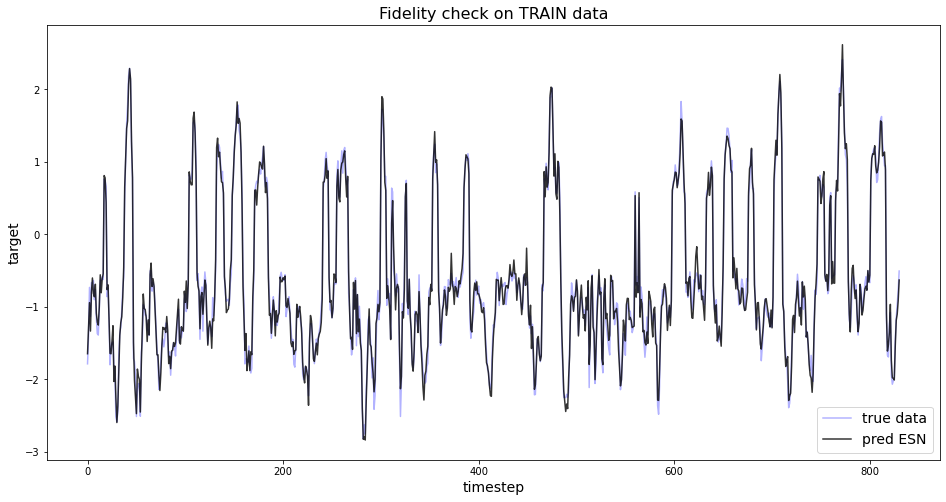

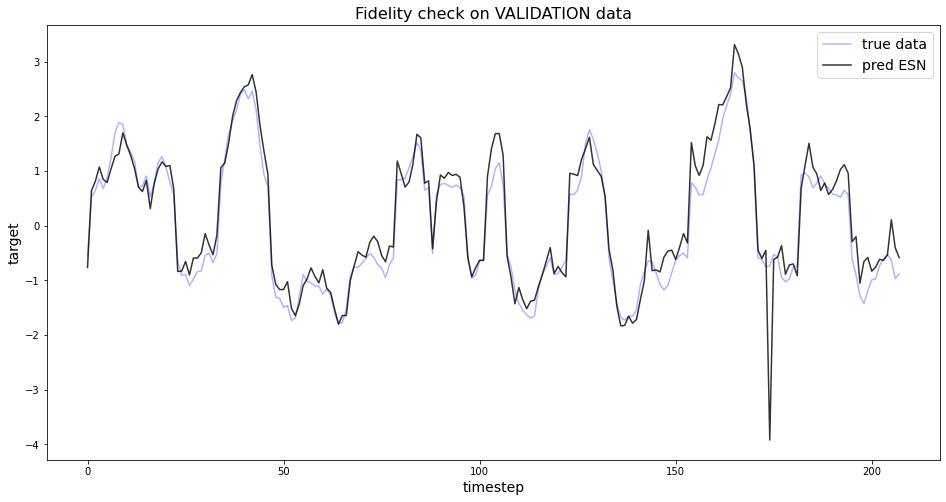

In [222]:
# Get complete model (output = target prediction) plus short model (output final reservoir states from all layers)
# and all_states (= another shortened model that gives reservoir states for ALL timesteps for all inputs).
model, model_short, all_states = setESN(input_length=input_length, in_features=in_features,
                                        out_features=out_features, n_layers=n_layers,
                                        n_res=n_res, W_in_lim=W_in_lim, leak_rate=leak_rate,
                                        leak_rate_first_step_YN=leak_rate_first_step_YN,
                                        activation=activation, spec_radius=spec_radius,
                                        sparsity=sparsity, verbose=verbose)

# Train ESN model's output weights and bias
model = trainESN(model, model_short, train_input_swap, train_target, verbose=verbose)

# Get predictions from trained ESN model and evaluation metrics on model performance:
train_pred, val_pred, train_mae, val_mae, train_mse, val_mse = predESN(model, train_input_swap, val_input_swap,
                                                                       train_target, val_target,
                                                                       verbose=verbose)



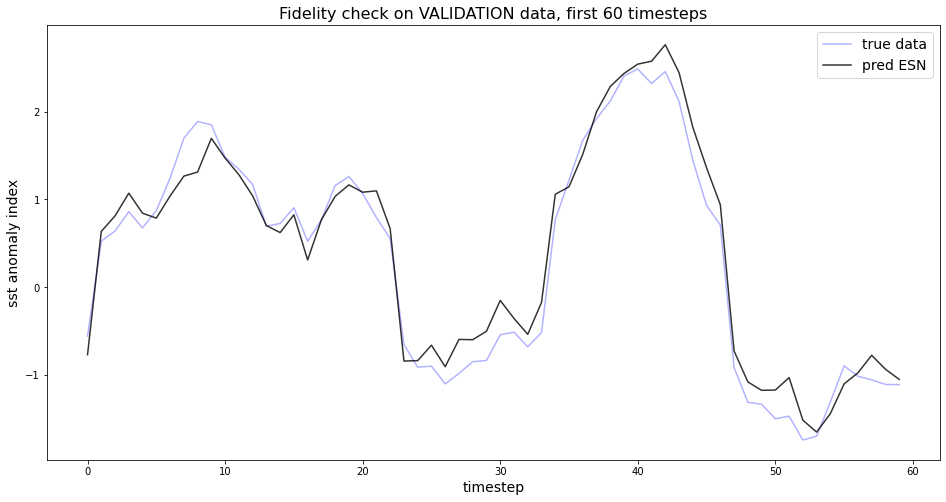

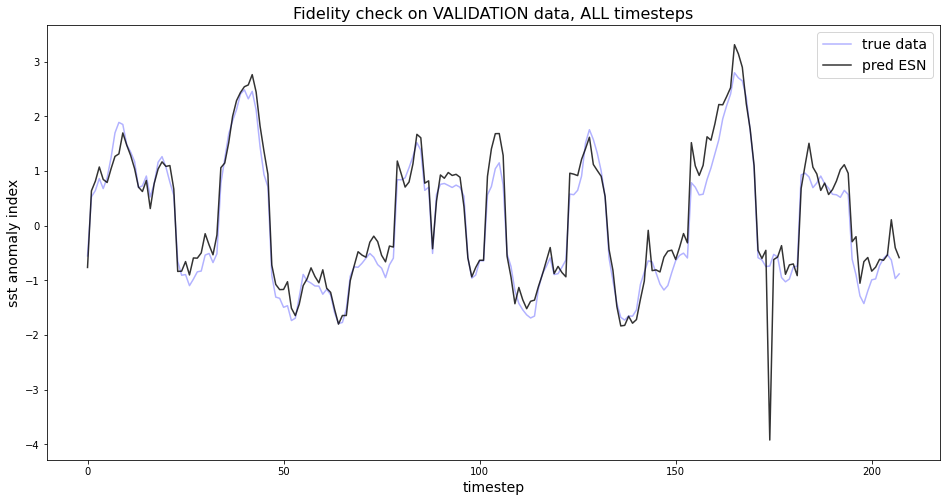

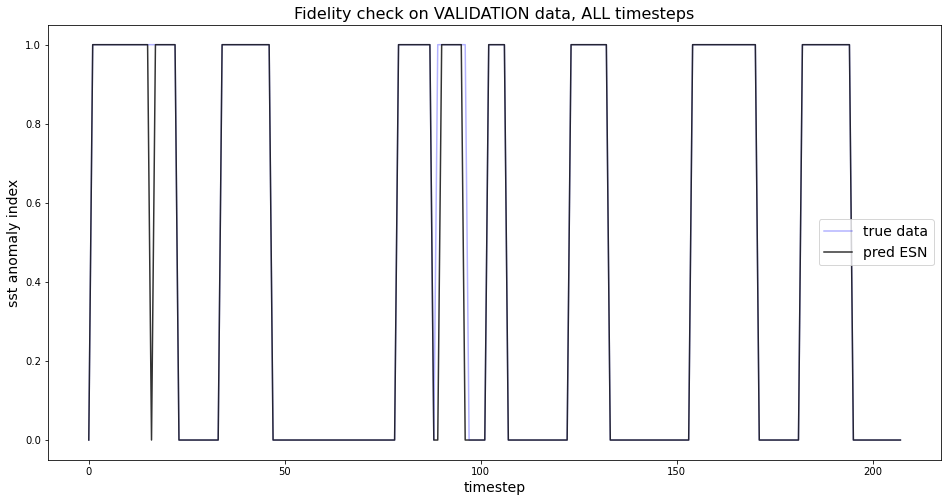


Validation accuracy:
El Nino:  0.97
La Nina:  1.0

Train accuracy:
El Nino:  0.92
La Nina:  1.0


In [223]:
# Convert to binary prediction:
train_pred_bin = (train_pred > 0.5)
val_pred_bin = (val_pred > 0.5)

if verbose:   
    # Fidelity check: Plot val_pred vs. val_targets, but only the first 60 timesteps
    plt.figure(figsize=(16,8))
    plt.plot(range(len(val_target[:60,0])),val_target[:60,0],'b',label="true data", alpha=0.3)
    plt.plot(range(len(val_pred[:60,0])),val_pred[:60,0],'k',  alpha=0.8, label='pred ESN')
    plt.title('Fidelity check on VALIDATION data, first 60 timesteps', fontsize=16)
    plt.xlabel('timestep', fontsize=14)
    plt.ylabel('sst anomaly index', fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    # Fidelity check: Plot val_pred vs. val_targets, ALL timesteps
    plt.figure(figsize=(16,8))
    plt.plot(range(len(val_target[:,0])),val_target[:,0],'b',label="true data", alpha=0.3)
    plt.plot(range(len(val_pred[:,0])),val_pred[:,0],'k',  alpha=0.8, label='pred ESN')
    plt.title('Fidelity check on VALIDATION data, ALL timesteps', fontsize=16)
    plt.xlabel('timestep', fontsize=14)
    plt.ylabel('sst anomaly index', fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    # Fidelity check: Plot val_pred_bin vs. val_targetbin, ALL timesteps
    plt.figure(figsize=(16,8))
    plt.plot(range(len(val_target_bin[:,0])),val_target_bin[:,0],'b',label="true data", alpha=0.3)
    plt.plot(range(len(val_pred_bin[:,0])),val_pred_bin[:,0],'k',  alpha=0.8, label='pred ESN')
    plt.title('Fidelity check on VALIDATION data, ALL timesteps', fontsize=16)
    plt.xlabel('timestep', fontsize=14)
    plt.ylabel('sst anomaly index', fontsize=14)
    plt.legend(fontsize=14)
    plt.show()    


## Check accuracy: How often is the correct label predicted?
## Note: Accurate prediction means having a certain event (e.g. El Nino) and correctly predicting 
## to have that same event.

# Get validation accuracy: Rel. amount of correctly predicted events.
val_acc_ElNino = sum((val_pred_bin[:,0] == val_target_bin[:,0]) & (val_target_bin[:,0] == 1)) / sum(val_target_bin[:,0] == 1)
val_acc_LaNina = sum((val_pred_bin[:,0] == val_target_bin[:,0]) & (val_target_bin[:,0] == 0)) / sum(val_target_bin[:,0] == 0)

# Get train accuracy: Rel. amount of correctly predicted events.
train_acc_ElNino = sum((train_pred_bin[:,0] == train_target_bin[:,0]) & (train_target_bin[:,0] == 1)) / sum(train_target_bin[:,0] == 1)
train_acc_LaNina = sum((train_pred_bin[:,0] == train_target_bin[:,0]) & (train_target_bin[:,0] == 0)) / sum(train_target_bin[:,0] == 0)


if verbose:
    print("\nValidation accuracy:")
    print("El Nino: ", np.round(val_acc_ElNino,2))
    print("La Nina: ", np.round(val_acc_LaNina,2))

    print("\nTrain accuracy:")
    print("El Nino: ", np.round(train_acc_ElNino,2))
    print("La Nina: ", np.round(train_acc_LaNina,2))

Sample dimensions and prediction:
raw sample shape (1, timesteps, features):  (1, 180, 89)
number of timesteps:  180
number of input features in_feat:  89
number of res. units n_res:  300
leak rate alpha:  0.005
model prediction on sample:  2.54

Model weights and biases, Dimensions:
input weights W_in (input features, res. units):  (89, 300)
input biases b_in (res. units):  (300,)
reservoir weights W_res (res. units, res. units):  (300, 300)
reservoir biases b_res (res. units):  (300,)
output weights W_out (res. units, output features):  (300, 1)
output biases b_out (output features):  (1,)


/var/folders/jv/p__lpnd50w93ff78f84hkwkh7fs9_f/T/ipykernel_850/1004174692.py:46: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())



Tensor shapes:
input tensor U (timesteps, input features):  (180, 89)
all res. states X (timesteps, res. units):  (180, 300)
activations ACT (timesteps, res. units):  (180, 300)


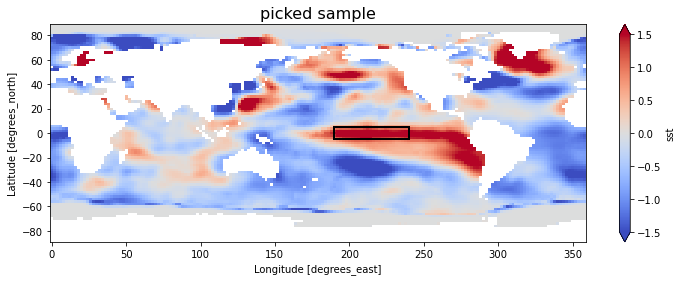

In [224]:
### Pick out ONE El Nino sample to be analysed:
sample_id = 40 # number 40 of validation inputs --> El Nino sample
#sample_id = 52 # number 52 of validation inputs --> La Nina sample
sample = val_input_swap[sample_id:sample_id+1,:,:]

## If feeding the sample column-wise is desired, need to swap lat <-> lon for input sample:
#sample = np.swapaxes(sample, 1, 2)

# Plot sample input
fig, ax = plt.subplots(figsize=(12, 4))
sst_anomaly_fields_NinoNina[sample_id].name = 'sst anomaly deg Celsius'
sst_anomaly_fields_NinoNina[sample_id].plot(ax=ax, cmap='coolwarm', vmax=1.5, vmin=-1.5)
plt.title('picked sample', fontsize=16)

# Create a Rectangle patch and add the patch to the Axes
rect = patches.Rectangle((190, -5), 50, 10, linewidth=2, edgecolor='black', facecolor='none')
ax.add_patch(rect)

# Extract number of timesteps (timesteps) and variable T to loop over.
# Note: Subtract 1 from absolute number of timesteps to get T, since loops start at 0.
timesteps = sample.shape[1]
T = timesteps - 1

# Extract number of input features:
in_feat = sample.shape[2]

# Rename leak_rate to 'a' for convenience and readability of LRP algorithm:
a = leak_rate

# Have trained model as pre-requisite. For BOTH output units (El Nino / La Nina) check prediction on picked sample:
pred = model.predict(sample)

## Check dimensions and prediction:
print("Sample dimensions and prediction:")
print("=================================")
print("raw sample shape (1, timesteps, features): ", sample.shape)
print("number of timesteps: ", timesteps)
print("number of input features in_feat: ", in_feat)
print("number of res. units n_res: ", n_res)
print("leak rate alpha: ", a)
print("model prediction on sample: ", np.round(pred[0,0],3))

### Extract model weights from trained model:

## Get all weights:
model_weights = np.array(model.get_weights())

## Set input / reservoir / output weights and bias(es):
W_in = model_weights[0]
b_in = model_weights[1]
W_res = model_weights[2]
b_res = model_weights[3]
W_out = model_weights[4]
b_out = model_weights[5]

## Check dimensions:
print("\nModel weights and biases, Dimensions:")
print("=====================================")
print("input weights W_in (input features, res. units): ", W_in.shape)
print("input biases b_in (res. units): ", b_in.shape)
print("reservoir weights W_res (res. units, res. units): ", W_res.shape)
print("reservoir biases b_res (res. units): ", b_res.shape)
print("output weights W_out (res. units, output features): ", W_out.shape)
print("output biases b_out (output features): ", b_out.shape)

## Set tensors for inputs U, activation layer ACT and all reservoir states X:

# Get inputs U for all timesteps from raw input sample by just omitting first dimension (=sample number):
U = sample[0,:,:]

# Get all reservoir states for all timesteps X on picked sample, omit first dimension (=sample number):
X = all_states.predict(sample)[0,:,:]

# Get X' from all reservoir states X, shifted by one timestep and adding ZEROs as first row:
X_prime = np.concatenate([np.zeros((1,n_res)),X[:-1,:]], axis=0)

# Get activation layer ACT from relation: X = (1 - alpha) * X_prime + alpha * ACT
ACT = (X - (1 - a) * X_prime) / a

# Check dimensions:
print("\nTensor shapes:")
print("==============")
print("input tensor U (timesteps, input features): ", U.shape)
print("all res. states X (timesteps, res. units): ", X.shape)
print("activations ACT (timesteps, res. units): ", ACT.shape)

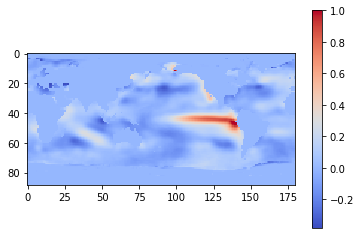

In [202]:
# Plot sample in reduced size:
plt.imshow(np.swapaxes(sample[0,:,:], 0,1), cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

In [225]:
### LRP on baseESN (col-wise): Only take positive contributions of pre-potential into account.
### EL NINO

## Start with layer T

# Get relevances R_i and first part of R_j for n_res units x_i in ACT(T) and x_j in X(T-1), respectively,
# connecting to OUTPUT unit x_o:
R_i = (a * (np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0]) /
       sum((np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])) * pred[0,0])
R_j_1 = ((1 - a) * (np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])
         / sum((np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])) * pred[0,0])

# Get relevances R_k for in_feat input units x_k of U(T)
R_k = np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)
             / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

# Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
R_j_2 = np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)
/ (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

# Combine both contributions for relevance R_j, for n_res units x_j of X(T-1):
R_j = R_j_1 + R_j_2

## Store relevance for input layer U for current timestep.
R_all = np.reshape(R_k,(1,len(R_k)))

# Store other relevances for plausibility check:
R_i_sum = []
R_j_sum = []
R_k_sum = []
R_j_1_sum = []
R_j_2_sum = []
R_i_sum.append(sum(R_i))
R_j_sum.append(sum(R_j))
R_k_sum.append(sum(R_k))
R_j_1_sum.append(sum(R_j_1))
R_j_2_sum.append(sum(R_j_2))

### Now loop over remaining T-1 layers in decreasing order. Start with T-1, stop at first layer, since that needs
### special treatment.


for t in np.flip(np.arange(1,T)):
    
    # Get relevances R_i for n_res units x_i of ACT(t). Note: Each unit x_i is only connected to a
    # single corresponding unit x_m of X(t), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_i = a * R_j
    
    # The same holds true for first part of relevances R_j_1 for n_res units x_j of X(t-1) connecting to
    # n_res units x_m of X(t), multiplied by (1-alpha), no weights and bias.
    R_j_1 = (1 - a) * R_j
    
    # Get relevances R_k for in_feat input units x_k of U(T)
    R_k = np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)
                 / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

    # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
    R_j_2 = np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)
    / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)
    
    # Combine both contributions for relevance R_j, for n_res units x_j of X(t-1):
    R_j = R_j_1 + R_j_2

    ## Store relevance for input layer U for current timestep.
    R_all = np.concatenate([np.reshape(R_k,(1,len(R_k))), R_all], axis=0)
    
    # Store other relevances for plausibility check:
    R_i_sum.append(sum(R_i))
    R_j_sum.append(sum(R_j))
    R_k_sum.append(sum(R_k))
    R_j_1_sum.append(sum(R_j_1))
    R_j_2_sum.append(sum(R_j_2))
    
## Since we worked with swapped sample (lat <-> lon), reverse swapping:
R_all_1pos = np.swapaxes(R_all, 0, 1)

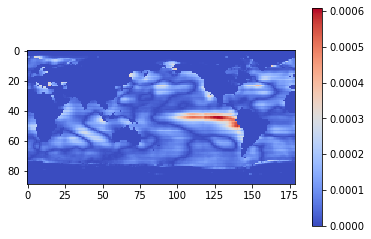

In [226]:
# baseESN, feed inputs col-wise, tanh activation, alpha = 0.005
# Relevance heatmap for single El Nino sample, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1]
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_all_1pos, cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

### baseESN (col-wise): Fading memory according to leakrate

The higher the leakrate, the more relevance is put on leter input timesteps. Feeding input samples col-wise leaves us with $T=180$ timesteps. Choosing $\alpha=0.005$ enables the model to remember even the very first columns we fed into the model. But this memory is observed to *fade away* with increasing $\alpha$, so does the accuracy: At some point the model doesn't *remember* inputs from Nino region and accuracy drops. Stated below are validation accuracies on El Nino / La Nina samples, followed by train accuracies on El Nino / La Nina samples:

- $\alpha=0.005$: 96% / 99% (val acc), 96% / 100% (train acc)
- $\alpha=0.05$: 95% / 99% (val acc), 96% / 100% (train acc)
- $\alpha=0.1$: 97% / 100% (val acc), 95% / 100% (train acc)
- $\alpha=0.2$: 81% / 100% (val acc), 89% / 100% (train acc)
- $\alpha=0.3$: 62% / 90% (val acc), 78% / 100% (train acc)
- $\alpha=0.4$: 31% / 94% (val acc), 65% / 100% (train acc)

**Note:** For increasing $\alpha$ the models fail because predictions are too low for El Nino samples. This is clearly seen in dropping accuracy on validation and train samples (El Nino). However, accuracy for La Nina samples remains close to perfection, but this is deceiving! Assume we always predict *La Nina*: Then also the accuracy on La Nina would be 100%.

--> Need different way of measuring accuracy, if we want to publish these results. What about **recall**?

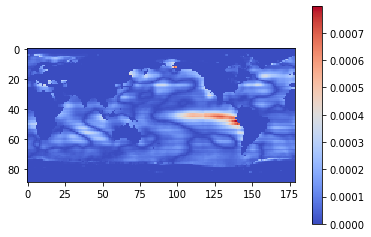

In [204]:
# baseESN, feed inputs col-wise, tanh activation, alpha = 0.005
# Relevance heatmap for single El Nino sample, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1]
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_all_1pos, cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

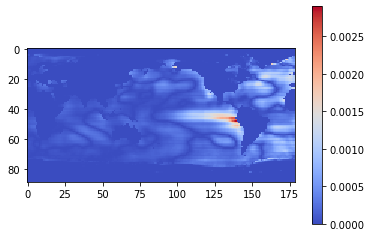

In [143]:
# baseESN, feed inputs col-wise, tanh activation, alpha = 0.05
# Relevance heatmap for single El Nino sample, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1]
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_all_1pos, cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

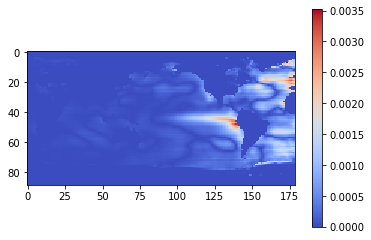

In [149]:
# baseESN, feed inputs col-wise, tanh activation, alpha = 0.1
# Relevance heatmap for single El Nino sample, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1]
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_all_1pos, cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

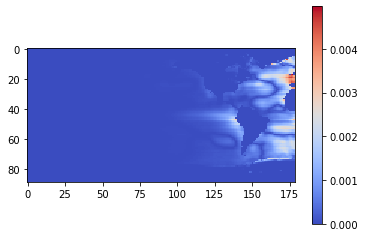

In [156]:
# baseESN, feed inputs col-wise, tanh activation, alpha = 0.2
# Relevance heatmap for single El Nino sample, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1]
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_all_1pos, cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

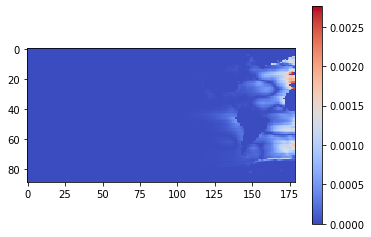

In [162]:
# baseESN, feed inputs col-wise, tanh activation, alpha = 0.3
# Relevance heatmap for single El Nino sample, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1]
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_all_1pos, cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

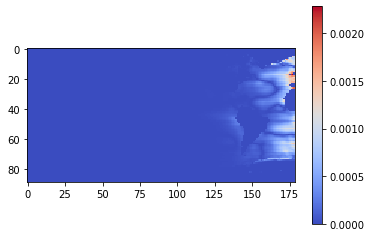

In [219]:
# baseESN, feed inputs col-wise, tanh activation, alpha = 0.4
# Relevance heatmap for single El Nino sample, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1]
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_all_1pos, cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

In [175]:
### LRP for baseESN (col-wise): LA NINA
### Since we work with single continuous target, take inverse prediction (= positive) as final relevance.
### Then only take negative contributions of pre-potential into account.

## Start with layer T

# Get relevances R_i and first part of R_j for n_res units x_i in ACT(T) and x_j in X(T-1), respectively,
# connecting to OUTPUT unit x_o:
R_i = (a * (np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0]) /
       sum((np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0])) * -pred[0,0])
R_j_1 = ((1 - a) * (np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0])
         / sum((np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0])) * -pred[0,0])

# Get relevances R_k for in_feat input units x_k of U(T)
R_k = np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)
             / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

# Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
R_j_2 = np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)
/ (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

# Combine both contributions for relevance R_j, for n_res units x_j of X(T-1):
R_j = R_j_1 + R_j_2

## Store relevance for input layer U for current timestep.
R_all = np.reshape(R_k,(1,len(R_k)))

# Store other relevances for plausibility check:
R_i_sum = []
R_j_sum = []
R_k_sum = []
R_j_1_sum = []
R_j_2_sum = []
R_i_sum.append(sum(R_i))
R_j_sum.append(sum(R_j))
R_k_sum.append(sum(R_k))
R_j_1_sum.append(sum(R_j_1))
R_j_2_sum.append(sum(R_j_2))

### Now loop over remaining T-1 layers in decreasing order. Start with T-1, stop at first layer, since that needs
### special treatment.


for t in np.flip(np.arange(1,T)):
    
    # Get relevances R_i for n_res units x_i of ACT(t). Note: Each unit x_i is only connected to a
    # single corresponding unit x_m of X(t), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_i = a * R_j
    
    # The same holds true for first part of relevances R_j_1 for n_res units x_j of X(t-1) connecting to
    # n_res units x_m of X(t), multiplied by (1-alpha), no weights and bias.
    R_j_1 = (1 - a) * R_j
    
    # Get relevances R_k for in_feat input units x_k of U(T)
    R_k = np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)
                 / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

    # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
    R_j_2 = np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)
    / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)
    
    # Combine both contributions for relevance R_j, for n_res units x_j of X(t-1):
    R_j = R_j_1 + R_j_2

    ## Store relevance for input layer U for current timestep.
    R_all = np.concatenate([np.reshape(R_k,(1,len(R_k))), R_all], axis=0)
    
    # Store other relevances for plausibility check:
    R_i_sum.append(sum(R_i))
    R_j_sum.append(sum(R_j))
    R_k_sum.append(sum(R_k))
    R_j_1_sum.append(sum(R_j_1))
    R_j_2_sum.append(sum(R_j_2))
    
## Since we worked with swapped sample (lat <-> lon), reverse swapping:
R_all_2pos = np.swapaxes(R_all, 0, 1)

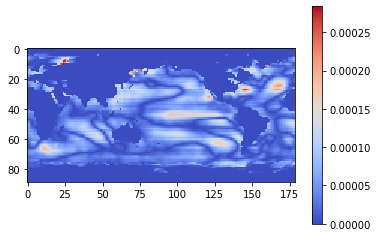

In [176]:
# baseESN, feed inputs col-wise, tanh activation, alpha = 0.005
# Relevance heatmap for single La Nina sample, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1]
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_all_2pos, cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

### baseESN (column-wise): Get mean relevance maps for ALL El Nino / La Nina samples (from train inputs)

In [14]:
## Reminder: Check scaling of swapped inputs:
np.min(train_input_swap)

-1.0

In [177]:
### LRP with baseESN on ALL El Nino / La Nina samples (from train inputs)

verbose=False

## Split train inputs into El Nino / La Nina samples, according to binary target:
samples_ElNino = train_input_swap[(train_target_bin==1)[:,0]]
samples_LaNina = train_input_swap[(train_target_bin==0)[:,0]]

## Split targets accordingly:
targets_ElNino = train_target[(train_target_bin==1)[:,0]]

if verbose:
    print("samples_ElNino shape: ", samples_ElNino.shape)
    print("samples_LaNina shape: ", samples_LaNina.shape)

# Extract number of timesteps (timesteps) and variable T to loop over.
# Note: Subtract 1 from absolute number of timesteps to get T, since loops start at 0.
timesteps = samples_ElNino.shape[1]
T = timesteps - 1

# Extract number of input features:
in_feat = samples_ElNino.shape[2]

# Rename leak_rate to 'a' for convenience and readability of LRP algorithm:
a = leak_rate

### Extract model weights from trained model:

## Get all weights:
model_weights = np.array(model.get_weights())

## Set input / reservoir / output weights and bias(es):
W_in = model_weights[0]
b_in = model_weights[1]
W_res = model_weights[2]
b_res = model_weights[3]
W_out = model_weights[4]
b_out = model_weights[5]

## Initialize storage for mean relevance over all ElNino samples.
## Note: First timestep is still missing in algorithm.
R_all_mean = np.zeros((T, in_feat))
    
#Loop over El Nino samples:
for sample_id in range(len(samples_ElNino)):
    
    # Print status:
    print ("sample: ", sample_id+1, " from ", len(samples_ElNino))
    
    # Get current sample:
    sample = samples_ElNino[sample_id:sample_id+1]
    
    # Have trained model as pre-requisite. Check prediction and target on picked sample:
    pred = model.predict(sample)[0,0]
    
    ## Set tensors for inputs U, activation layer ACT and all reservoir states X:

    # Get inputs U for all timesteps from raw input sample by just omitting first dimension (=sample number):
    U = sample[0,:,:]

    # Get all reservoir states for all timesteps X on picked sample, omit first dimension (=sample number):
    X = all_states.predict(sample)[0,:,:]

    # Get X' from all reservoir states X, shifted by one timestep and adding ZEROs as first row:
    X_prime = np.concatenate([np.zeros((1,n_res)),X[:-1,:]], axis=0)

    # Get activation layer ACT from relation: X = (1 - alpha) * X_prime + alpha * ACT
    ACT = (X - (1 - a) * X_prime) / a
    
    ### LRP on baseESN: Second attempt, only consider positive contributions of pre-potential into account.

    ## Start with layer T

    # Get relevances R_i and first part of R_j for n_res units x_i in ACT(T) and x_j in X(T-1), respectively,
    # connecting to single OUTPUT unit x_o:
    R_i = (a * (np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0]) /
           sum((np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])) * pred)
    R_j_1 = ((1 - a) * (np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])
             / sum((np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])) * pred)

    # Get relevances R_k for in_feat input units x_k of U(T)
    R_k = np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)
                 / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

    # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
    R_j_2 = np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)
    / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

    # Combine both contributions for relevance R_j, for n_res units x_j of X(T-1):
    R_j = R_j_1 + R_j_2

    ## Store relevance for input layer U for current timestep.
    R_all = np.reshape(R_k,(1,len(R_k)))

    ### Now loop over remaining T-1 layers in decreasing order. Start with T-1, stop at first layer, since that needs
    ### special treatment.


    for t in np.flip(np.arange(1,T)):

        # Get relevances R_i for n_res units x_i of ACT(t). Note: Each unit x_i is only connected to a
        # single corresponding unit x_m of X(t), multiplied by alpha. 
        # No additional weights and bias in this connection, hence w=1 and b=0.
        R_i = a * R_j

        # The same holds true for first part of relevances R_j_1 for n_res units x_j of X(t-1) connecting to
        # n_res units x_m of X(t), multiplied by (1-alpha), no weights and bias.
        R_j_1 = (1 - a) * R_j

        # Get relevances R_k for in_feat input units x_k of U(T)
        R_k = np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)
                     / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                        + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

        # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
        R_j_2 = np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)
        / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                        + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

        # Combine both contributions for relevance R_j, for n_res units x_j of X(t-1):
        R_j = R_j_1 + R_j_2

        ## Store relevance for input layer U for current timestep.
        R_all = np.concatenate([np.reshape(R_k,(1,len(R_k))), R_all], axis=0)
        
    ## Add relevance for current sample to storage for ALL samples:
    R_all_mean += R_all

## Get mean relevance over ALL samples:
R_all_mean = R_all_mean / len(samples_ElNino)

## Since we worked with swapped sample (lat <-> lon), reverse swapping:
R_all_mean_nino = np.swapaxes(R_all_mean, 0, 1)

/var/folders/jv/p__lpnd50w93ff78f84hkwkh7fs9_f/T/ipykernel_850/601689665.py:30: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())


sample:  1  from  195
sample:  2  from  195
sample:  3  from  195
sample:  4  from  195
sample:  5  from  195
sample:  6  from  195
sample:  7  from  195
sample:  8  from  195
sample:  9  from  195
sample:  10  from  195
sample:  11  from  195
sample:  12  from  195
sample:  13  from  195
sample:  14  from  195
sample:  15  from  195
sample:  16  from  195
sample:  17  from  195
sample:  18  from  195
sample:  19  from  195
sample:  20  from  195
sample:  21  from  195
sample:  22  from  195
sample:  23  from  195
sample:  24  from  195
sample:  25  from  195
sample:  26  from  195
sample:  27  from  195
sample:  28  from  195
sample:  29  from  195
sample:  30  from  195
sample:  31  from  195
sample:  32  from  195
sample:  33  from  195
sample:  34  from  195
sample:  35  from  195
sample:  36  from  195
sample:  37  from  195
sample:  38  from  195
sample:  39  from  195
sample:  40  from  195
sample:  41  from  195
sample:  42  from  195
sample:  43  from  195
sample:  44  from  1

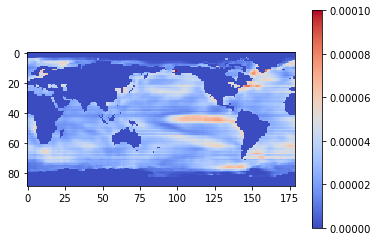

In [185]:
# baseESN, feed inputs col-wise into model, tanh activation
# Mean relevance heatmap El Nino, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1]
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_all_mean_nino, cmap='coolwarm', interpolation='nearest', vmax=0.0001)
plt.colorbar()
plt.show()

In [188]:
## Initialize storage for mean relevance over all LaNina samples.
## Note: First timestep is still missing in algorithm.
R_all_mean = np.zeros((T, in_feat))
    
#Loop over El Nino samples:
for sample_id in range(len(samples_LaNina)):
    
    # Print status:
    print ("sample: ", sample_id+1, " from ", len(samples_LaNina))
    
    # Get current sample:
    sample = samples_LaNina[sample_id:sample_id+1]
    
    # Have trained model as pre-requisite. Check prediction and target on picked sample:
    pred = model.predict(sample)[0,0]
    #print(pred)
    
    ## Set tensors for inputs U, activation layer ACT and all reservoir states X:

    # Get inputs U for all timesteps from raw input sample by just omitting first dimension (=sample number):
    U = sample[0,:,:]

    # Get all reservoir states for all timesteps X on picked sample, omit first dimension (=sample number):
    X = all_states.predict(sample)[0,:,:]

    # Get X' from all reservoir states X, shifted by one timestep and adding ZEROs as first row:
    X_prime = np.concatenate([np.zeros((1,n_res)),X[:-1,:]], axis=0)

    # Get activation layer ACT from relation: X = (1 - alpha) * X_prime + alpha * ACT
    ACT = (X - (1 - a) * X_prime) / a
    
    ### LRP on baseESN: Second attempt, only consider positive contributions of pre-potential into account.

    ## Start with layer T

    # Get relevances R_i and first part of R_j for n_res units x_i in ACT(T) and x_j in X(T-1), respectively,
    # connecting to single OUTPUT unit x_o:
    R_i = (a * (np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0]) /
           sum((np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0])) * -pred)
    R_j_1 = ((1 - a) * (np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0])
             / sum((np.multiply(ACT[T,:],W_out[:,0])<0) * np.multiply(ACT[T,:],W_out[:,0])) * -pred)

    # Get relevances R_k for in_feat input units x_k of U(T)
    R_k = np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)
                 / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

    # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
    R_j_2 = np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)
    / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

    # Combine both contributions for relevance R_j, for n_res units x_j of X(T-1):
    R_j = R_j_1 + R_j_2

    ## Store relevance for input layer U for current timestep.
    R_all = np.reshape(R_k,(1,len(R_k)))

    ### Now loop over remaining T-1 layers in decreasing order. Start with T-1, stop at first layer, since that needs
    ### special treatment.


    for t in np.flip(np.arange(1,T)):

        # Get relevances R_i for n_res units x_i of ACT(t). Note: Each unit x_i is only connected to a
        # single corresponding unit x_m of X(t), multiplied by alpha. 
        # No additional weights and bias in this connection, hence w=1 and b=0.
        R_i = a * R_j

        # The same holds true for first part of relevances R_j_1 for n_res units x_j of X(t-1) connecting to
        # n_res units x_m of X(t), multiplied by (1-alpha), no weights and bias.
        R_j_1 = (1 - a) * R_j

        # Get relevances R_k for in_feat input units x_k of U(T)
        R_k = np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)
                     / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                        + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

        # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
        R_j_2 = np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)
        / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)<0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                        + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)<0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

        # Combine both contributions for relevance R_j, for n_res units x_j of X(t-1):
        R_j = R_j_1 + R_j_2

        ## Store relevance for input layer U for current timestep.
        R_all = np.concatenate([np.reshape(R_k,(1,len(R_k))), R_all], axis=0)
        
    ## Add relevance for current sample to storage for ALL samples:
    R_all_mean += R_all

## Get mean relevance over ALL samples:
R_all_mean = R_all_mean / len(samples_LaNina)

## Since we worked with swapped sample (lat <-> lon), reverse swapping:
R_all_mean_nina = np.swapaxes(R_all_mean, 0, 1)

sample:  1  from  636
sample:  2  from  636
sample:  3  from  636
sample:  4  from  636
sample:  5  from  636
sample:  6  from  636
sample:  7  from  636
sample:  8  from  636
sample:  9  from  636
sample:  10  from  636
sample:  11  from  636
sample:  12  from  636
sample:  13  from  636
sample:  14  from  636
sample:  15  from  636
sample:  16  from  636
sample:  17  from  636
sample:  18  from  636
sample:  19  from  636
sample:  20  from  636
sample:  21  from  636
sample:  22  from  636
sample:  23  from  636
sample:  24  from  636
sample:  25  from  636
sample:  26  from  636
sample:  27  from  636
sample:  28  from  636
sample:  29  from  636
sample:  30  from  636
sample:  31  from  636
sample:  32  from  636
sample:  33  from  636
sample:  34  from  636
sample:  35  from  636
sample:  36  from  636
sample:  37  from  636
sample:  38  from  636
sample:  39  from  636
sample:  40  from  636
sample:  41  from  636
sample:  42  from  636
sample:  43  from  636
sample:  44  from  6

sample:  347  from  636
sample:  348  from  636
sample:  349  from  636
sample:  350  from  636
sample:  351  from  636
sample:  352  from  636
sample:  353  from  636
sample:  354  from  636
sample:  355  from  636
sample:  356  from  636
sample:  357  from  636
sample:  358  from  636
sample:  359  from  636
sample:  360  from  636
sample:  361  from  636
sample:  362  from  636
sample:  363  from  636
sample:  364  from  636
sample:  365  from  636
sample:  366  from  636
sample:  367  from  636
sample:  368  from  636
sample:  369  from  636
sample:  370  from  636
sample:  371  from  636
sample:  372  from  636
sample:  373  from  636
sample:  374  from  636
sample:  375  from  636
sample:  376  from  636
sample:  377  from  636
sample:  378  from  636
sample:  379  from  636
sample:  380  from  636
sample:  381  from  636
sample:  382  from  636
sample:  383  from  636
sample:  384  from  636
sample:  385  from  636
sample:  386  from  636
sample:  387  from  636
sample:  388  fr

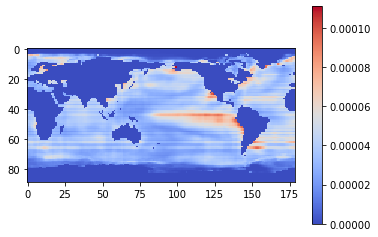

In [189]:
# baseESN, feed inputs col-wise into model, tanh activation
# Mean relevance heatmap La Nina, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1]
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_all_mean_nina, cmap='coolwarm', interpolation='nearest')#, vmax=0.0001)
plt.colorbar()
plt.show()

### Investigate robustness of col-wise base ESN on permuting inputs

sst anomaly is found to have a strong **zonal** character. Feeding inputs column-wise into the model, we support this zonal structure, because each latitude is fed into the model as one long timeseries of 180 steps (= longitude).

We now want to investigate, if our approach is robust against permutation of input gridpoints: For each row we apply some random (but reversible!) permutation of gridpoints.

Then check accuracy and restore (reverse permutation!) relevance map: Does the model still find Nino region to be most relevant?

**Note:** For the above coupled ESN approach, we expect it to be robust against such permutation, since we couple each gridpoint to exactly one reservoir unit and reservoir units are initialized randomly. Permutation should have no effect.

In [9]:
# Get random permutation of number of timesteps (here longitude dimension):
rand_perm = np.random.permutation(train_input_swap.shape[1])
rand_perm

array([122, 176,  54,  26, 110,  79,  78,  25, 116,  72,  67, 128, 171,
       152, 112, 153,  57,  48,  35, 137,  39,   7, 103,  70,  74, 124,
        71,   8,  93,  75,  99, 139,   4, 168,  34,  17, 136, 133, 166,
        29,  92, 149,  61,  16,  41, 178,  52, 155, 106,  31, 118,  24,
        43, 111,   1,   3,  66,  15,  53, 175,  64, 114,  59,  22,   5,
        30,  60, 140,  51,  85,  33,  89,  49,  86, 121, 135, 125, 100,
       107,  76,  84,  36, 119,  96, 120, 108,  90, 147, 144,  73,  98,
       145, 163,  68, 158, 159, 102, 173,  14, 148, 172, 156,  65, 130,
       160,  12,  91,  13,   0, 151,  40, 146, 132,  18, 104,  44,  23,
       115,  81, 109, 177,  45, 157,  80,  10,  94,  50,  21,  87, 170,
         6,  88, 129,  28, 127,  20,  19,  69,  11,  82, 150,  62, 134,
       143, 167, 169,  47,  77, 162, 138,   2,  37,  58, 142,  46,  32,
       105,  38, 117,  83, 113,  42, 165,   9, 164, 141, 126, 174, 131,
        97, 161, 123,  56,  27,  95, 154, 101,  63,  55, 179])

In [49]:
## Now apply this permutation to validation and train inputs:

# Initialize storage (samples, timesteps, features):
val_input_swap_perm = np.zeros(val_input_swap.shape)
train_input_swap_perm = np.zeros(train_input_swap.shape)

## Validation inputs: 

# Loop over number of samples:
for sample in range(val_input_swap.shape[0]):
    
    # Loop over number of features:
    for feat in range(val_input_swap.shape[2]):
        
        # Store permutation:
        val_input_swap_perm[sample,:,feat] = val_input_swap[sample,rand_perm,feat]
        
## Train inputs: 

# Loop over number of samples:
for sample in range(train_input_swap.shape[0]):
    
    # Loop over number of features:
    for feat in range(train_input_swap.shape[2]):
        
        # Store permutation:
        train_input_swap_perm[sample,:,feat] = train_input_swap[sample,rand_perm,feat]

In [51]:
## Now reverse permutation on validation inputs:

# Initialize storage (samples, timesteps, features):
val_input_swap_perm_rev = np.zeros(val_input_swap_perm.shape)

# Get reverse permutation from argsort:
perm_rev = np.argsort(rand_perm)

# Loop over number of samples:
for sample in range(val_input_swap_perm.shape[0]):
    
    # Loop over number of features:
    for feat in range(val_input_swap_perm.shape[2]):
        
        # Store permutation:
        val_input_swap_perm_rev[sample,:,feat] = val_input_swap_perm[sample,perm_rev,feat]

In [81]:
sample_temp = np.copy(sample)
sample_temp[(sample==0)] = -1

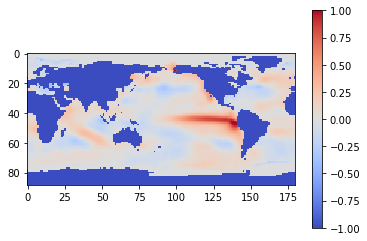

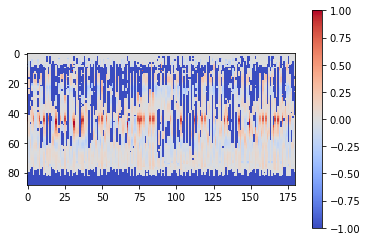

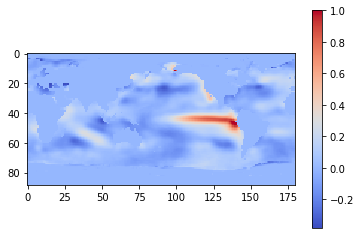

In [84]:
### Pick out ONE sample to be analysed:

# Set sample id:
sample_id = 40 # number 40 of validation inputs --> El Nino sample
#sample_id = 52 # number 52 of validation inputs --> La Nina sample

# Get original and permuted sample:
sample = val_input_swap[sample_id,:,:]
sample_perm = val_input_swap_perm[sample_id,:,:]
sample_perm_rev = val_input_swap_perm_rev[sample_id,:,:]

# Set former NaN values from zero to -1, to have better contrast for continents :
sample[sample==0] = -1
sample_perm[sample_perm==0] = -1

# Plot original sample:
plt.imshow(np.swapaxes(sample, 0,1), cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

# Plot permutation:
plt.imshow(np.swapaxes(sample_perm, 0,1), cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

# Plot sample after reversed permutation:
plt.imshow(np.swapaxes(sample_perm_rev, 0,1), cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

### Train baseESN model (col-wise) on permuted inputs

In [72]:
### Try classification of sst anomaly fields with base ESN. Define parameters for ESN model upfront
verbose = True
input_length = train_input_swap_perm.shape[1] # Number of input timesteps, directly taken from inputs' shape.
n_layers = 1 # Number of ESN layers in the model.
n_res = 300 # Number of reservoir units.
W_in_lim = 0.1 # Initialize input weights from random uniform distribution in [- W_in_lim, + W_in_lim]
leak_rate = 0.005 # Leak rate used in transition function of reservoir states.
leak_rate_first_step_YN = False # If true, multiply with alpha already in calculating first timestes's res. states.
activation = 'tanh' # Desired activation function to be used in calculating reservoir state transition.
spec_radius = 0.8 # Spectral radius, becomes largest Eigenvalue of reservoir weight matrix.
sparsity = 0.3 # Sparsity of reservoir weight matrix.
in_features = train_input_swap_perm.shape[2] # Number of input features, directly taken from inputs' shape.
out_features = 1 # E.g. 2 for classifying sst anomaly fields according to El Nino / La Nina events on one-hot targets.

/Users/mlandt-hayen/MarDATA/Python/EchoStateNetworks/notebooks/ESN_functions_v05.py:712: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())
/Users/mlandt-hayen/MarDATA/Python/EchoStateNetworks/notebooks/ESN_functions_v05.py:751: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 180, 89)]         0         
_________________________________________________________________
esn_4 (ESN)                  ((None, 180, 300), (None, 117300    
_________________________________________________________________
output (Dense)               (None, 1)                 301       
Total params: 117,601
Trainable params: 117,601
Non-trainable params: 0
_________________________________________________________________
Model: "model_short"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 180, 89)]         0         
_________________________________________________________________
esn_4 (ESN)                  ((None, 180, 300), (None, 117300    
Total params: 117,300
Trainable pa

/Users/mlandt-hayen/MarDATA/Python/EchoStateNetworks/notebooks/ESN_functions_v05.py:791: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())



shape of train input (samples, timesteps, input features):  (831, 180, 89)
shape of model output X_T (samples, n_res):  (831, 300)

Final reservoir states in augmented notation, shape:  (831, 301)

train_target shape (samples, output features):  (831, 1)

W_out shape:  (300, 1)
b_out shape:  (1,)

output feature  0 , trained b_out:  [29.26533175]


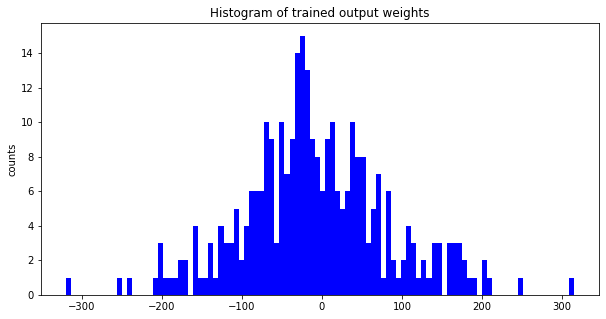


shape of val input (samples, timesteps, features):  (208, 180, 89)
shape of train input (samples, timesteps, features):  (831, 180, 89)

shape of model predictions on validation input (samples, 1):  (208, 1)
shape of val targets (samples, 1):  (208, 1)

train_mae:  0.0961
val_mae:  0.2979

train_mse:  0.0145
val_mse:  0.1397


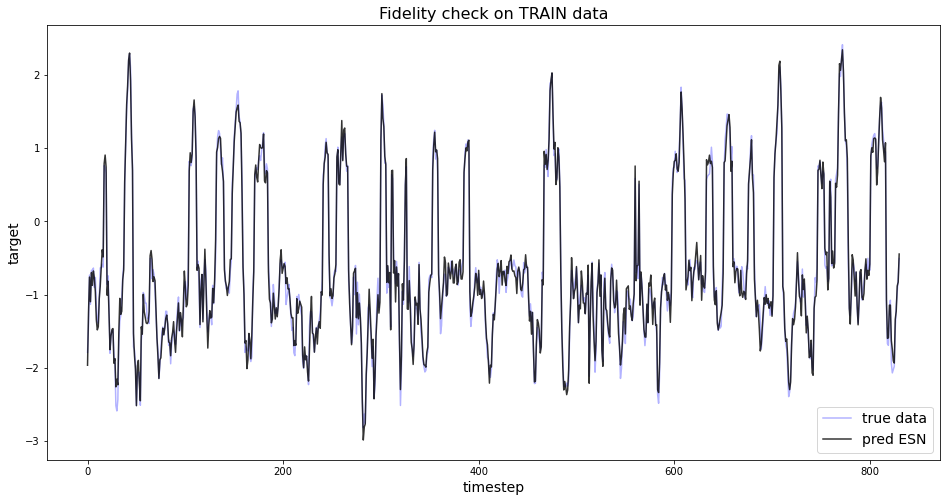

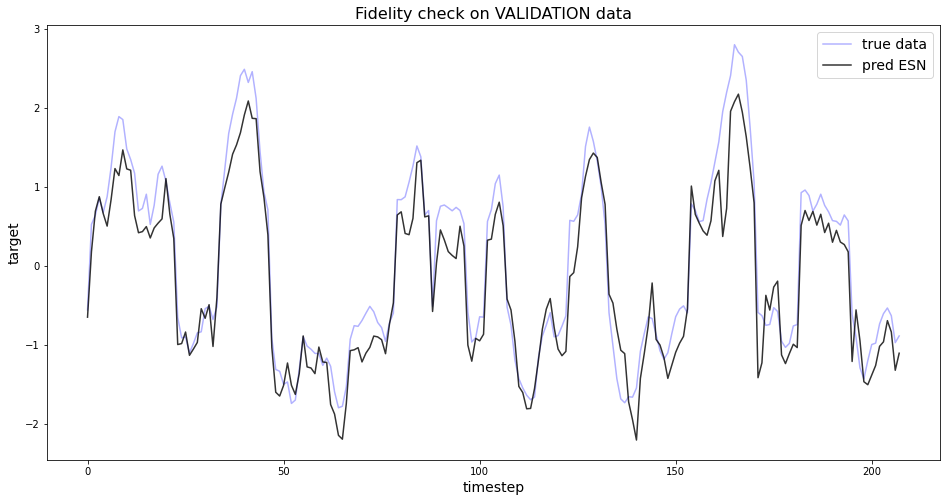

In [77]:
# Get complete model (output = target prediction) plus short model (output final reservoir states from all layers)
# and all_states (= another shortened model that gives reservoir states for ALL timesteps for all inputs).
model, model_short, all_states = setESN(input_length=input_length, in_features=in_features,
                                        out_features=out_features, n_layers=n_layers,
                                        n_res=n_res, W_in_lim=W_in_lim, leak_rate=leak_rate,
                                        leak_rate_first_step_YN=leak_rate_first_step_YN,
                                        activation=activation, spec_radius=spec_radius,
                                        sparsity=sparsity, verbose=verbose)

# Train ESN model's output weights and bias
model = trainESN(model, model_short, train_input_swap_perm, train_target, verbose=verbose)

# Get predictions from trained ESN model and evaluation metrics on model performance:
train_pred, val_pred, train_mae, val_mae, train_mse, val_mse = predESN(model, train_input_swap_perm,
                                                                       val_input_swap_perm,
                                                                       train_target, val_target,
                                                                       verbose=verbose)




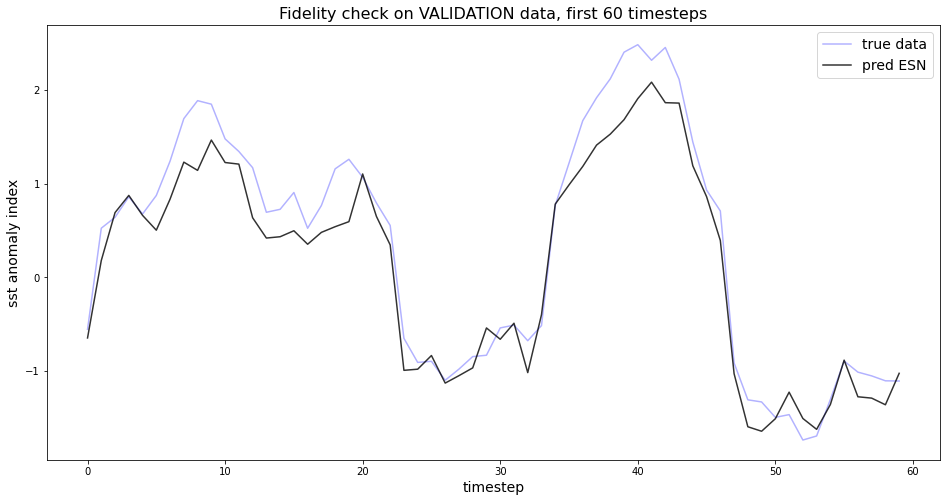

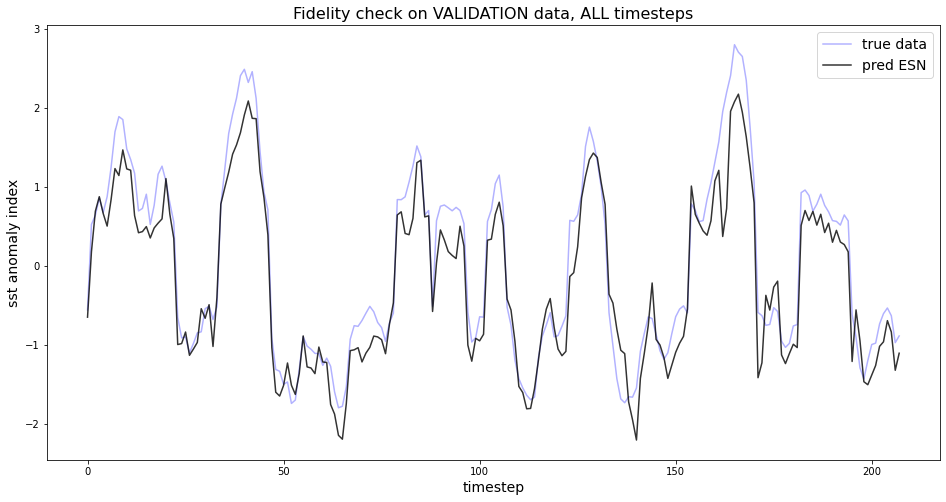

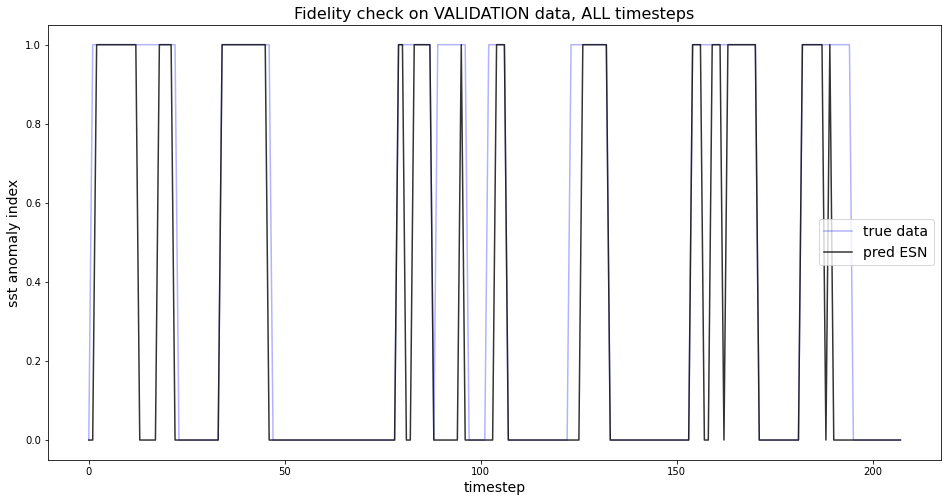


Validation accuracy:
El Nino:  0.68
La Nina:  1.0

Train accuracy:
El Nino:  0.94
La Nina:  1.0


In [78]:
# Convert to binary prediction:
train_pred_bin = (train_pred > 0.5)
val_pred_bin = (val_pred > 0.5)

if verbose:   
    # Fidelity check: Plot val_pred vs. val_targets, but only the first 60 timesteps
    plt.figure(figsize=(16,8))
    plt.plot(range(len(val_target[:60,0])),val_target[:60,0],'b',label="true data", alpha=0.3)
    plt.plot(range(len(val_pred[:60,0])),val_pred[:60,0],'k',  alpha=0.8, label='pred ESN')
    plt.title('Fidelity check on VALIDATION data, first 60 timesteps', fontsize=16)
    plt.xlabel('timestep', fontsize=14)
    plt.ylabel('sst anomaly index', fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    # Fidelity check: Plot val_pred vs. val_targets, ALL timesteps
    plt.figure(figsize=(16,8))
    plt.plot(range(len(val_target[:,0])),val_target[:,0],'b',label="true data", alpha=0.3)
    plt.plot(range(len(val_pred[:,0])),val_pred[:,0],'k',  alpha=0.8, label='pred ESN')
    plt.title('Fidelity check on VALIDATION data, ALL timesteps', fontsize=16)
    plt.xlabel('timestep', fontsize=14)
    plt.ylabel('sst anomaly index', fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    # Fidelity check: Plot val_pred_bin vs. val_targetbin, ALL timesteps
    plt.figure(figsize=(16,8))
    plt.plot(range(len(val_target_bin[:,0])),val_target_bin[:,0],'b',label="true data", alpha=0.3)
    plt.plot(range(len(val_pred_bin[:,0])),val_pred_bin[:,0],'k',  alpha=0.8, label='pred ESN')
    plt.title('Fidelity check on VALIDATION data, ALL timesteps', fontsize=16)
    plt.xlabel('timestep', fontsize=14)
    plt.ylabel('sst anomaly index', fontsize=14)
    plt.legend(fontsize=14)
    plt.show()    


## Check accuracy: How often is the correct label predicted?
## Note: Accurate prediction means having a certain event (e.g. El Nino) and correctly predicting 
## to have that same event.

# Get validation accuracy: Rel. amount of correctly predicted events.
val_acc_ElNino = sum((val_pred_bin[:,0] == val_target_bin[:,0]) & (val_target_bin[:,0] == 1)) / sum(val_target_bin[:,0] == 1)
val_acc_LaNina = sum((val_pred_bin[:,0] == val_target_bin[:,0]) & (val_target_bin[:,0] == 0)) / sum(val_target_bin[:,0] == 0)

# Get train accuracy: Rel. amount of correctly predicted events.
train_acc_ElNino = sum((train_pred_bin[:,0] == train_target_bin[:,0]) & (train_target_bin[:,0] == 1)) / sum(train_target_bin[:,0] == 1)
train_acc_LaNina = sum((train_pred_bin[:,0] == train_target_bin[:,0]) & (train_target_bin[:,0] == 0)) / sum(train_target_bin[:,0] == 0)


if verbose:
    print("\nValidation accuracy:")
    print("El Nino: ", np.round(val_acc_ElNino,2))
    print("La Nina: ", np.round(val_acc_LaNina,2))

    print("\nTrain accuracy:")
    print("El Nino: ", np.round(train_acc_ElNino,2))
    print("La Nina: ", np.round(train_acc_LaNina,2))

Sample dimensions and prediction:
raw sample shape (1, timesteps, features):  (1, 180, 89)
number of timesteps:  180
number of input features in_feat:  89
number of res. units n_res:  300
leak rate alpha:  0.005
model prediction on sample:  2.002

Model weights and biases, Dimensions:
input weights W_in (input features, res. units):  (89, 300)
input biases b_in (res. units):  (300,)
reservoir weights W_res (res. units, res. units):  (300, 300)
reservoir biases b_res (res. units):  (300,)
output weights W_out (res. units, output features):  (300, 1)
output biases b_out (output features):  (1,)


/var/folders/jv/p__lpnd50w93ff78f84hkwkh7fs9_f/T/ipykernel_1224/2523413796.py:46: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  model_weights = np.array(model.get_weights())



Tensor shapes:
input tensor U (timesteps, input features):  (180, 89)
all res. states X (timesteps, res. units):  (180, 300)
activations ACT (timesteps, res. units):  (180, 300)


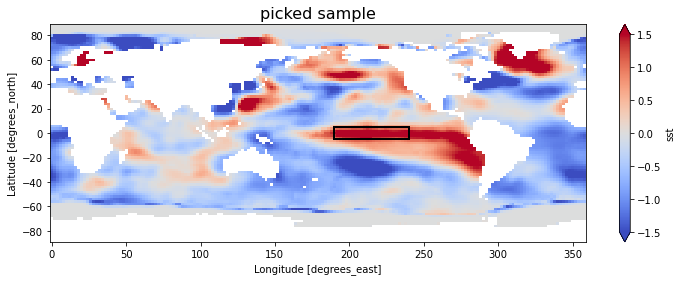

In [60]:
### Pick out ONE El Nino sample to be analysed:
sample_id = 40 # number 40 of validation inputs --> El Nino sample
#sample_id = 52 # number 52 of validation inputs --> La Nina sample
sample = val_input_swap_perm[sample_id:sample_id+1,:,:]

## If feeding the sample column-wise is desired, need to swap lat <-> lon for input sample:
#sample = np.swapaxes(sample, 1, 2)

# Plot sample input
fig, ax = plt.subplots(figsize=(12, 4))
sst_anomaly_fields_NinoNina[sample_id].name = 'sst anomaly deg Celsius'
sst_anomaly_fields_NinoNina[sample_id].plot(ax=ax, cmap='coolwarm', vmax=1.5, vmin=-1.5)
plt.title('picked sample', fontsize=16)

# Create a Rectangle patch and add the patch to the Axes
rect = patches.Rectangle((190, -5), 50, 10, linewidth=2, edgecolor='black', facecolor='none')
ax.add_patch(rect)

# Extract number of timesteps (timesteps) and variable T to loop over.
# Note: Subtract 1 from absolute number of timesteps to get T, since loops start at 0.
timesteps = sample.shape[1]
T = timesteps - 1

# Extract number of input features:
in_feat = sample.shape[2]

# Rename leak_rate to 'a' for convenience and readability of LRP algorithm:
a = leak_rate

# Have trained model as pre-requisite. For BOTH output units (El Nino / La Nina) check prediction on picked sample:
pred = model.predict(sample)

## Check dimensions and prediction:
print("Sample dimensions and prediction:")
print("=================================")
print("raw sample shape (1, timesteps, features): ", sample.shape)
print("number of timesteps: ", timesteps)
print("number of input features in_feat: ", in_feat)
print("number of res. units n_res: ", n_res)
print("leak rate alpha: ", a)
print("model prediction on sample: ", np.round(pred[0,0],3))

### Extract model weights from trained model:

## Get all weights:
model_weights = np.array(model.get_weights())

## Set input / reservoir / output weights and bias(es):
W_in = model_weights[0]
b_in = model_weights[1]
W_res = model_weights[2]
b_res = model_weights[3]
W_out = model_weights[4]
b_out = model_weights[5]

## Check dimensions:
print("\nModel weights and biases, Dimensions:")
print("=====================================")
print("input weights W_in (input features, res. units): ", W_in.shape)
print("input biases b_in (res. units): ", b_in.shape)
print("reservoir weights W_res (res. units, res. units): ", W_res.shape)
print("reservoir biases b_res (res. units): ", b_res.shape)
print("output weights W_out (res. units, output features): ", W_out.shape)
print("output biases b_out (output features): ", b_out.shape)

## Set tensors for inputs U, activation layer ACT and all reservoir states X:

# Get inputs U for all timesteps from raw input sample by just omitting first dimension (=sample number):
U = sample[0,:,:]

# Get all reservoir states for all timesteps X on picked sample, omit first dimension (=sample number):
X = all_states.predict(sample)[0,:,:]

# Get X' from all reservoir states X, shifted by one timestep and adding ZEROs as first row:
X_prime = np.concatenate([np.zeros((1,n_res)),X[:-1,:]], axis=0)

# Get activation layer ACT from relation: X = (1 - alpha) * X_prime + alpha * ACT
ACT = (X - (1 - a) * X_prime) / a

# Check dimensions:
print("\nTensor shapes:")
print("==============")
print("input tensor U (timesteps, input features): ", U.shape)
print("all res. states X (timesteps, res. units): ", X.shape)
print("activations ACT (timesteps, res. units): ", ACT.shape)

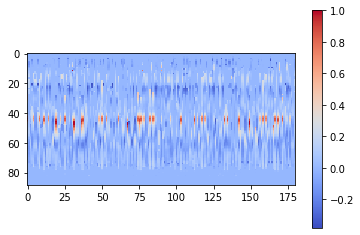

In [61]:
# Plot sample in reduced size:
plt.imshow(np.swapaxes(sample[0,:,:], 0,1), cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

In [62]:
### LRP on baseESN (col-wise): Only take positive contributions of pre-potential into account.
### EL NINO

## Start with layer T

# Get relevances R_i and first part of R_j for n_res units x_i in ACT(T) and x_j in X(T-1), respectively,
# connecting to OUTPUT unit x_o:
R_i = (a * (np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0]) /
       sum((np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])) * pred[0,0])
R_j_1 = ((1 - a) * (np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])
         / sum((np.multiply(ACT[T,:],W_out[:,0])>0) * np.multiply(ACT[T,:],W_out[:,0])) * pred[0,0])

# Get relevances R_k for in_feat input units x_k of U(T)
R_k = np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)
             / (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

# Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
R_j_2 = np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)
/ (np.sum((np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[T,:],(in_feat,1)),W_in), axis=0)
                + np.sum((np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[T-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

# Combine both contributions for relevance R_j, for n_res units x_j of X(T-1):
R_j = R_j_1 + R_j_2

## Store relevance for input layer U for current timestep.
R_all = np.reshape(R_k,(1,len(R_k)))

# Store other relevances for plausibility check:
R_i_sum = []
R_j_sum = []
R_k_sum = []
R_j_1_sum = []
R_j_2_sum = []
R_i_sum.append(sum(R_i))
R_j_sum.append(sum(R_j))
R_k_sum.append(sum(R_k))
R_j_1_sum.append(sum(R_j_1))
R_j_2_sum.append(sum(R_j_2))

### Now loop over remaining T-1 layers in decreasing order. Start with T-1, stop at first layer, since that needs
### special treatment.


for t in np.flip(np.arange(1,T)):
    
    # Get relevances R_i for n_res units x_i of ACT(t). Note: Each unit x_i is only connected to a
    # single corresponding unit x_m of X(t), multiplied by alpha. 
    # No additional weights and bias in this connection, hence w=1 and b=0.
    R_i = a * R_j
    
    # The same holds true for first part of relevances R_j_1 for n_res units x_j of X(t-1) connecting to
    # n_res units x_m of X(t), multiplied by (1-alpha), no weights and bias.
    R_j_1 = (1 - a) * R_j
    
    # Get relevances R_k for in_feat input units x_k of U(T)
    R_k = np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)
                 / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)

    # Get second contribution R_j_2 for relevance R_j for n_res units x_j of X(T-1) connecting to x_i units of ACT(T).
    R_j_2 = np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)
    / (np.sum((np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in)>0) * np.multiply(np.reshape(U[t,:],(in_feat,1)),W_in), axis=0)
                    + np.sum((np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res)>0) * np.multiply(np.reshape(X[t-1,:],(n_res, 1)),W_res), axis=0)) * R_i, axis=1)
    
    # Combine both contributions for relevance R_j, for n_res units x_j of X(t-1):
    R_j = R_j_1 + R_j_2

    ## Store relevance for input layer U for current timestep.
    R_all = np.concatenate([np.reshape(R_k,(1,len(R_k))), R_all], axis=0)
    
    # Store other relevances for plausibility check:
    R_i_sum.append(sum(R_i))
    R_j_sum.append(sum(R_j))
    R_k_sum.append(sum(R_k))
    R_j_1_sum.append(sum(R_j_1))
    R_j_2_sum.append(sum(R_j_2))
    
## Since we worked with swapped sample (lat <-> lon), reverse swapping:
R_all_1pos = np.swapaxes(R_all, 0, 1)

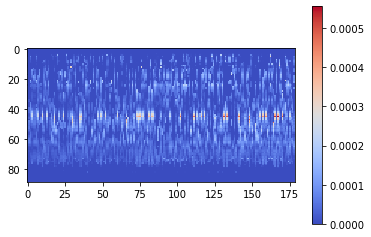

In [63]:
# baseESN, feed inputs col-wise, tanh activation, alpha = 0.005, random permutation on inputs
# Relevance heatmap for single El Nino sample, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1]
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_all_1pos, cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()

In [64]:
R_all_1pos.shape

(89, 179)

In [67]:
# Since we haven't finished LRP back to the first timestep, we are missing the first column in the
# obtained relevance map. Quick'n'dirty solution: Add first column as zeros, to have dimensions right:
R_all_1pos_ext = np.concatenate([np.zeros((89,1)), R_all_1pos], axis=1)

In [70]:
## Now reverse permutation to restore relevance map in its un-permuted form:

# Initialize storage (timesteps, features):
R_all_1pos_rev = np.zeros(R_all_1pos_ext.shape)

# Get reverse permutation from argsort:
perm_rev = np.argsort(rand_perm)
  
# Loop over number of features:
for feat in range(R_all_1pos_ext.shape[0]):

    # Store permutation:
    R_all_1pos_rev[feat,:] = R_all_1pos_ext[feat, perm_rev]

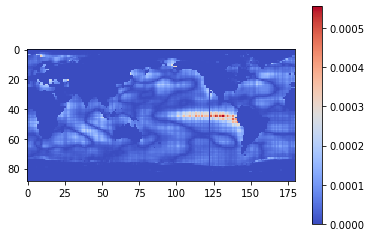

In [71]:
# baseESN, feed inputs col-wise, tanh activation, alpha = 0.005
# Relevance heatmap for single El Nino sample, CAPPED inputs (cap_limits = [-5, 5]), scaled to [-1,1]
# Single continuous normalized sst anomaly index as target.
plt.imshow(R_all_1pos_rev, cmap='coolwarm', interpolation='nearest')#, vmin=0, vmax=0.00005)
plt.colorbar()
plt.show()